<h1 style='color:orange; text-align:center; font-weight:bold'>Classification-Based Recommendation System for Crop Plantation</h1>

## **1 Introduction**
Which crop is best to grow under specific conditions is an important question in agriculture, especially for farmers. Selection of crops for farmers is not only critical for maintaining their source of livelihood but also maximizing their crop production to gain more profitability. However, the selection of crops is not always straightforward due to the available resources. This limitation of resources or environmental conditions can be addressed by utilizing data for making informed decisions, particularly with a machine learning approach to a recommendation system. A crop recommendation system can help farmers to make informed decision on selecting a suitable crop based on different factors. For example, when the weather is less predictable, the system can recommend a crop which can thrive under changing environmental conditions such as rainfall, humidity, and temperature. In addition to these weather conditions, soil quality especially because of overused soil or mismanagement, can be other challenges for growing crops with limited important nutrients such as nitrogen, potassium, and phosphorous. A crop recommendation system, therefore, can provide data-driven considerations to select a crop. My objective in this project is to build a classification-based recommendation system which can help farmers make informed decision about which crop to grow based on different factors, including soil and weather-related conditions. While the machine learning model will be evaluated with different metrics (F1, precision, recall, accuracy, training time, and Hamming loss), F1 score (micro-averaged) will be the main metric for assessing the model's prediction quality. The explanation for each metric and the consideration of F1 score are discussed in Section 4.

In order to build this recommendation system, I will use dataset from [Ingle](https://www.kaggle.com/datasets/atharvaingle/crop-recommendation-dataset/data) on Kaggle. This dataset contains 8 columns, including 1 column for the crop types. The dataset already involve both soil-related and weather-related information which are useful for building a crop recommendation system based on a multi-label classification model.
- `N`: ratio of Nitrogen content in soil
- `P`: ratio of Phosphor content in soil
- `K`: ratio of Potassium (or Kalium) content in soil
- `temperature`: temperature in degree Celsius
- `humidity`: relative humidity in %
- `ph`: acidity (pH) value of the soil
- `rainfall`: rainfall in mm
- `label`: crop types

In [119]:
# data exploration
from scipy.stats import skew, kurtosis, shapiro 
import ptitprince as pt
from matplotlib import colormaps
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches
plt.style.use('ggplot')
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import scipy.stats as stats

# machine learning and evaluation
import time
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_validate
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import hamming_loss, jaccard_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import label_binarize
from sklearn.calibration import calibration_curve, CalibratedClassifierCV
from sklearn.metrics import brier_score_loss
from sklearn.tree import plot_tree
from sklearn.inspection import PartialDependenceDisplay
import dice_ml
import random
from dice_ml import Dice
from lime.lime_tabular import LimeTabularExplainer
import joblib

## **2 Data Preparation**
This section is concerned with data import and data cleanliness check. While the data import is straightforward, the data cleanliness check will need to cover examining the dimension of the dataset, column names, including the data types, percentage of missing values and duplicats, and the number of unique values. This series of processes can be done into one step by creating a function for inspecting the dataset. If there are some issues, e.g., the presence of missing values or misidentification of data types, a further investigation needs to be carried further. Otherwise, the steps can be skipped and move on to the next step, i.e., checking the descriptive statistics. This sttaistical test will provide a numerical sense of the data distribution, including distribution-related problems such as incorrect measurements or anomalies.

In [120]:
# import dataset
data = pd.read_csv('../data/Crop_recommendation.csv')

In [121]:
# create function to inspect df
def inspect_dataframe(df):
    summary = {
        'ColumnName': df.columns.values.tolist(),
        'Nrow': df.shape[0],
        'DataType': df.dtypes.values.tolist(),
        'NAPct': (df.isna().mean() * 100).round(2).tolist(),
        'DuplicatePct': (df.duplicated().sum()/len(df)*100).round(2),
        'UniqueValue': df.nunique().tolist(),
        'Sample': [df[col].unique() for col in df.columns]
    }
    return pd.DataFrame(summary)

# inspect dataframe
print(f'The dataframe contains {data.shape[0]} rows and {data.shape[1]} cols.')
print(f"- {len(data.select_dtypes(include='number').columns)} are numeric cols")
print(f"- {len(data.select_dtypes(include='O').columns)} are object cols")
inspect_dataframe(data)

The dataframe contains 2200 rows and 8 cols.
- 7 are numeric cols
- 1 are object cols


,ColumnName,Nrow,DataType,NAPct,DuplicatePct,UniqueValue,Sample
0,N,2200,int64,0.0,0.0,137,"[90, 85, 60, 74, 78, 69, 94, 89, 68, 91, 93, 7..."
1,P,2200,int64,0.0,0.0,117,"[42, 58, 55, 35, 37, 53, 54, 46, 56, 50, 48, 3..."
2,K,2200,int64,0.0,0.0,73,"[43, 41, 44, 40, 42, 38, 36, 37, 39, 35, 45, 1..."
3,temperature,2200,float64,0.0,0.0,2200,"[20.87974371, 21.77046169, 23.00445915, 26.491..."
4,humidity,2200,float64,0.0,0.0,2200,"[82.00274423, 80.31964408, 82.3207629, 80.1583..."
5,ph,2200,float64,0.0,0.0,2200,"[6.502985292000001, 7.038096361, 7.840207144, ..."
6,rainfall,2200,float64,0.0,0.0,2200,"[202.9355362, 226.6555374, 263.9642476, 242.86..."
7,label,2200,object,0.0,0.0,22,"[rice, maize, chickpea, kidneybeans, pigeonpea..."


**Note**
- As the output shows, the dataset contains 8 columns (7 features and 1 target variable) and 2,200 entries. The number of variables is convenient for including them all during both exploratory data analysis in details and the predictive modeling. The number of rows, however, is relatively small. Small sample size may pose a challenge to a predictive model, especially overfitting. Overfitting problem occurs when the model is more likely to memorize the data instead of learning the underlying patterns and not able to generalize the patterns into new unseen data. This overfitting problem can be diagnosed by comparing the model's performance metrics on training and testing data. If the results indicate a wide gap between performance scores in training adn testing data, the model suffers from overfitting. When this situation happens, a simpler model, e.g., logistic regression or decision tree, can be chosen. And to make the diagnosis more convenient, in addition to using cross-validation, I will also compare different models from different types (e.g., linear-based, distance-based, and tree-based models) and complexity.
- In terms of data types, there are no misidentifications of data types. For this reason, data type conversion will be needed.
- The dataset is clean enough for predictive modeling. It does not contain any missing values and duplicates. It also does not contain any high unique values (high cardinality) because there is no categorical features, except the target variable, in the dataset. The issue of high cardinality will be troublesome for a machine learning model as it can increase the training time (computationally more intensive) and potentially lead to biased predictions over the majority class.

In [122]:
# compute desc stats
data.describe().round(2).transpose()

,count,mean,std,min,25%,50%,75%,max
N,2200.0,50.55,36.92,0.00,21.00,37.00,84.25,140.00
P,2200.0,53.36,32.99,5.00,28.00,51.00,68.00,145.00
K,2200.0,48.15,50.65,5.00,20.00,32.00,49.00,205.00
temperature,2200.0,25.62,5.06,8.83,22.77,25.60,28.56,43.68
humidity,2200.0,71.48,22.26,14.26,60.26,80.47,89.95,99.98
ph,2200.0,6.47,0.77,3.50,5.97,6.43,6.92,9.94
rainfall,2200.0,103.46,54.96,20.21,64.55,94.87,124.27,298.56


**Note**
- Checking from the large standard deviations, nitrogen (`N`), phosphor (`P`), potassium (`K`), and `rainfall` show a relatively wide range of values. Since standard deviation is a measure of spread, a large standard deviation means high spread or variability in dataset. If this problem is left untreated, it can introduce a challenge to a machine learning model, particularly to find out patterns and relationships. This simple statistical test, therefore, informs the need of feature engineering technique to rescale the values. 
- Additionally, comparing the min-max values and the quantile of 25% and 7% gives a valuable insight about the potential presence of outliers. For example there is a large difference between the Q3 and the max value in potassium ratio in soil (`K`). The wide gap indicates a potential presence of outliers. Here, I said "potential" because there are more formal detection on outliers, e.g., using z-score, interquartile range, or Mahalanobis distance.

## **3 Data Exploration**
This exploratory data analysis (EDA) deals with exploring the distribution of the target variable (`label`) and the numerical variable. Exploring the distribution of the target variable will provides an understanding of potential class imbalance problem. This problem is crucial as it may severely affect the model's performance, especially biased towards the majority class, and highlight the requirement of carrying out resampling (e.g., oversampling or undersampling). For the numerical variables, while previously I have conducted a descriptive statistical test, this test is less definitive so more formal tests are needed to investigate the distribution of the numerical features. 

Besides, an exploration on the relationship between variables will also be performed. The exploration will inform what kind of relationships between variables are, whether the relationships will introduce a significant problem to a machine learning model, and what kinds of machine learning models should be icnluded in the predictive modeling after finding out these insights.

### **3.1 Is there any class imbalance problem?**

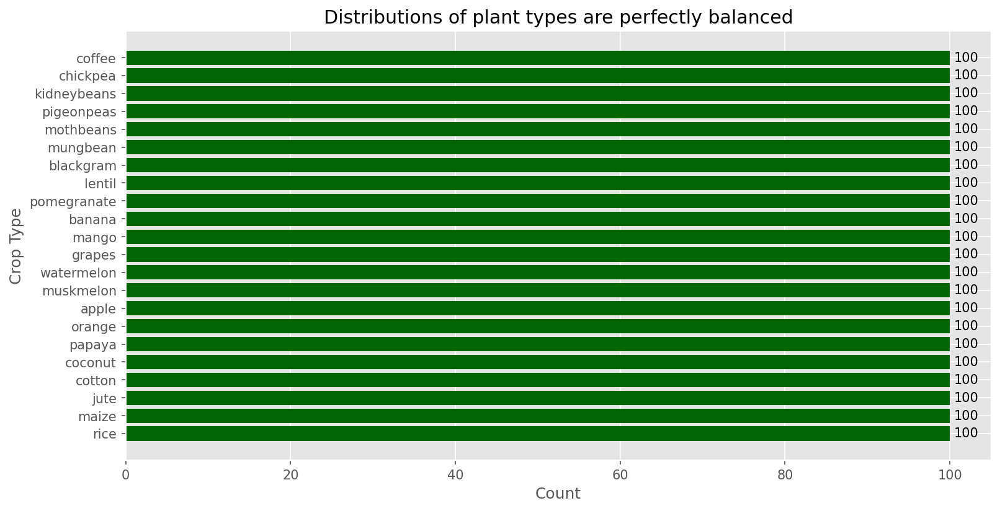

In [123]:
# Count occurrences of each label
plant_df = data['label'].value_counts().reset_index(name='count')

# Create the bar plot
plt.figure(figsize=(12, 6), dpi=150)
ax = plt.barh(plant_df['index'], plant_df['count'], color='darkgreen')

for index, value in enumerate(plant_df['count']):
    plt.text(value + 0.5, index, f'{value}', va='center', ha='left')

plt.xlabel('Count')
plt.ylabel('Crop Type')
plt.title('Distributions of plant types are perfectly balanced')
plt.show()

**Note**
- Interestingly, the distributions of crop types in the target variable is perfectly balanced. Most of the time, the target variable contains imbalanced distribution between classes so resampling techniques such as SMOTE (Synthetic Minority Oversampling Technique), ADASYN (Adaptive Synthetic (Oversampling) Technique), or NearMiss should be implemented to balace the distribution in the target variable.
- Because the quality of the target variable is excellent, I will not perform a further test on the distribution of crop types here. Instead, I will check the distribution of numerical features with respect to these categories in later sections.

### **3.2 Do all numerical features follow normal distribution?**

In [124]:
normality_test = []
# iterate over numerical columns
for col in data.select_dtypes(include='number').columns:
    data_feature = data[col].dropna() 

    if len(data_feature) > 1:  
        # calculate statistics
        feature_skewness = skew(data_feature)
        feature_kurtosis = kurtosis(data_feature)
        feature_shapiro_stat, feature_shapiro_p = shapiro(data_feature)
        
        normality_test.append({
            'feature': col,
            'skewness': feature_skewness,
            'kurtosis': feature_kurtosis,
            'w': feature_shapiro_stat,
            'pvalue': feature_shapiro_p,
            'distribution': 'not normal' if feature_shapiro_p < 0.05 else 'normal'
        })

# convert results to df
pd.DataFrame(normality_test).round(4)

,feature,skewness,kurtosis,w,pvalue,distribution
0,N,0.5094,-1.0586,0.9154,0.0,not normal
1,P,1.0101,0.8556,0.9112,0.0,not normal
2,K,2.3735,4.4365,0.6055,0.0,not normal
3,temperature,0.1848,1.2270,0.9821,0.0,not normal
4,humidity,-1.0910,0.2987,0.8664,0.0,not normal
5,ph,0.2837,1.6491,0.9791,0.0,not normal
6,rainfall,0.9651,0.6030,0.9303,0.0,not normal


**Note**
- Before moving forward to the visual examination on the data distribution, I checked the data distribution numerically to give a numerical sense of what the distribution is like. Combining both numerical and visual tests for data distribution is crucial to deeply understand the data spread.
- As shown above, all features exhibit non-normal data distributions according to Shapiro-Wilk test ([Shapiro & Wilk, 1965](http://www.jstor.org/stable/2333709)). The null hypothesis of this statistical test is that data comes from normal distribution so when the *p*-value is lower than the $\alpha$ at 0.05, the conclusion is the data is different from normal distribution. 
- While this statistical test already answered the distribution type, it is important to consider both skewness and kurtosis as well. These two tests inform the patterns of the distribution in a numerical sense. While skewness provides an understanding of the symmetry of the distribution, kurtosis indicates the peakedness or the height of the distribution.
- Based on the output above, the skewness ranges between -1.0 and 2.3 in all numerical features when the ideal skewness value is 0. The negative skewness in humidity tells that the distribution is more skewed to the left. This happens because some lower values pull the mean to the left. In contrast to humidity, other numerical features exhibit positive skewness with the largest skewness value found in potassium (K). This skewness suggests that the distribution of potassium ratio is moderately skewed to the right.
- To confirm these insights from the numerical output, below is the visual test along with the Shapiro-Wilk *W* test results.

Shapiro, S. S., & Wilk, M. B. (1965). An analysis of variance test for normality (complete samples). Biometrika, 52(3-4), 591-611.

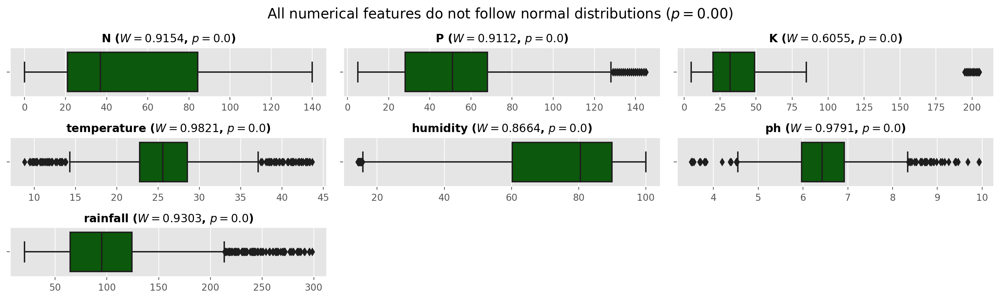

In [125]:
# compute SW test
df_numeric = data.select_dtypes(include='number')
shapiro_results = df_numeric.apply(lambda col: shapiro(col))
stats_df = pd.DataFrame({
    'column': df_numeric.columns,
    'sw_statistic': df_numeric.apply(lambda col: shapiro(col)[0]).values.round(4),
    'sw_pvalues': df_numeric.apply(lambda col: shapiro(col)[1]).values.round(4)
})

# display boxplots
plt.figure(figsize=(15, 7), dpi=200)
for i, col in enumerate(df_numeric.columns):
    plt.subplot(5, 3, i+1)
    sns.boxplot(x=data[col], color='darkgreen')
    # locate H stat and p-val
    row = stats_df[stats_df['column'] == col]
    statistic = row['sw_statistic'].values[0]
    p_value = row['sw_pvalues'].values[0]
    plt.title(f'{col} ($W = {statistic}$, $p = {p_value}$)', size=12, fontweight='bold')
    plt.xlabel(None)
plt.suptitle('All numerical features do not follow normal distributions ($p = 0.00$)', size=15)
plt.tight_layout()
plt.show()

**Note**
- Similar to the numerical test, the visual test also indicates that no numerical features follows normal distribution. This non-normality can be seen by the position of median and the length of the whiskers (lines extending from the box). Normal distribution is characterized by the symmetrical boxplot in which the median line is in the center of the box and the whisker has similar length. But these characteristics cannot be found in the numerical features above.
- Some columns also contain outliers (the dots outside the whiskers) but it remains unclear whether the outliers represent genuine variability within the classes, not errors or anomalies. Evaluating these outliers further, therefore, is required to determine if they are anomalies or real variability. If they are measurement or data entry errors, they can be simply removed or replaced by the measures of centrality (e.g., mean or median values). The choice will depend on, for example, the percentage of the outliers because the higher the rate, the larger the influence of the outliers is to the model. However, if the outliers or the extreme values represent anomalies, some treatments can be the options such as removal, capping/winsorization, or transformation (log transformation or square root transformation).
- Before deciding which treatment is more appropriate, a further check should be done. The next exploration must determine if the outliers are anomalies (just extreme values in some instances) or genuine variability. Genuineness can be determined when there are patterns. For example, the outliers belong to one or more specific classes. These outliers therefore represent genuine variability in the variable and indicate the actual values of the classes.

### **3.3 How many outliers does each feature have?**
In order to detect outliers in the dataset, I will utilize interquartile range (IQR). Unlike z-score detection of outliers, IQR-based detection is less sensitive to outliers since it depends on the quantiles whereas z-score-based detection relies more on mean ($\hat{x}$) and standard deviation ($\sigma$). When the distribution is skewed, mean is less reliable since the outliers affect the mean value. 

$$\text{z score} = \frac{x - \hat{x}}{\sigma}$$


In [126]:
# create function to detect outliers using IQR
def detect_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df.loc[(df[column] < lower_bound) | (df[column] > upper_bound)]
    print(f"The number of outliers in '{column}' is {len(outliers)} or {(len(outliers)/len(df)*100):.2f}% of the total data ({len(df)} rows)")

$$
\begin{align}
\text{IQR} &= Q3-Q1 \\
\text{Lower bound} &= Q1 - 1.5 \times IQR \\
\text{Upper bound} &= Q3 + 1.5 \times IQR
\end{align}
$$

In [127]:
# iteratively search for outliers
for i in data.select_dtypes(include='number').columns.tolist():
    detect_outliers(data, i)

The number of outliers in 'N' is 0 or 0.00% of the total data (2200 rows)
The number of outliers in 'P' is 138 or 6.27% of the total data (2200 rows)
The number of outliers in 'K' is 200 or 9.09% of the total data (2200 rows)
The number of outliers in 'temperature' is 86 or 3.91% of the total data (2200 rows)
The number of outliers in 'humidity' is 30 or 1.36% of the total data (2200 rows)
The number of outliers in 'ph' is 57 or 2.59% of the total data (2200 rows)
The number of outliers in 'rainfall' is 100 or 4.55% of the total data (2200 rows)


**Note**
- The output of the iterative outlier detection shows that some columns contain a more than 2% outliers such as phosphor (`P`), potassium (`K`), `temperature`, acidity (`ph`), and `rainfall`. This insight adds previous understanding about the data. Previously, I could only tell there are some outliers in specific columns but here the number and the rate of the outliers are revealed.
- Next I will check what causes the outliers: specific classes (genuine data in specific crop types) or random. To do this exploration I will only check numerical features containing outliers and relate them with the target variable, i.e., `label`. 

#### **3.3.1 What causes the outliers in temperatures?**

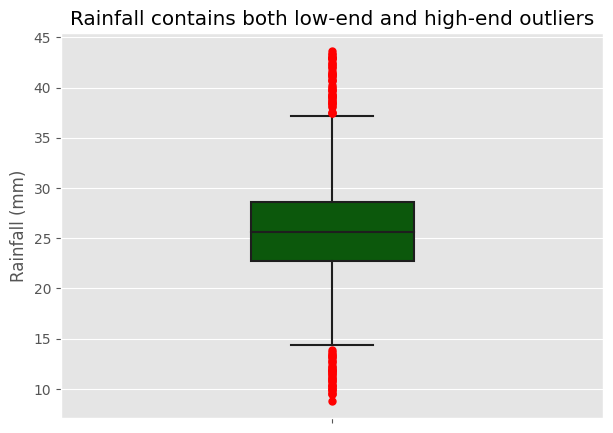

In [128]:
plt.figure(figsize=(7, 5), dpi=100)
sns.boxplot(y=data['temperature'], color='darkgreen', width=0.3, 
            flierprops=dict(marker='.', markerfacecolor='red', 
                            markeredgecolor='red', alpha=1, 
                            markersize=10))

plt.title('Rainfall contains both low-end and high-end outliers')
plt.ylabel('Rainfall (mm)')
plt.show()

In [129]:
q1 = data['temperature'].quantile(0.25)
q3 = data['temperature'].quantile(0.75)
iqr = q3 - q1
upper_threshold = q3 + 1.5 * iqr
lower_threshold = q1 - 1.5 * iqr
lower_count = data[(data['temperature'] < lower_threshold)]['label'].value_counts()
higher_count = data[(data['temperature'] > upper_threshold)]['label'].value_counts()
print('Outliers in low-end of the distribution:')
display(lower_count.reset_index(name='count'))
print('\nOutliers in high-end of the distribution:')
display(higher_count.reset_index(name='count'))

Outliers in low-end of the distribution:


,index,count
0,grapes,21
1,orange,17



Outliers in high-end of the distribution:


,index,count
0,papaya,35
1,grapes,13


**Note**: As the boxplot above shows outliers are located in the low-end and high-end of the distribution, the numerical test using IQR method was used again to detect what causes outliers. The IQR method also informs that grapes and oranges are the causes of outliers in the low-end; and outliers in the high-end of the distribution are contributed by papayas and grapes. So far, it is possible that grapes are adaptable because it can grow in low to high temperatures. But this is only a half of the insight. To understand further, I will visualize the distribution of temperatures based on crop types. 

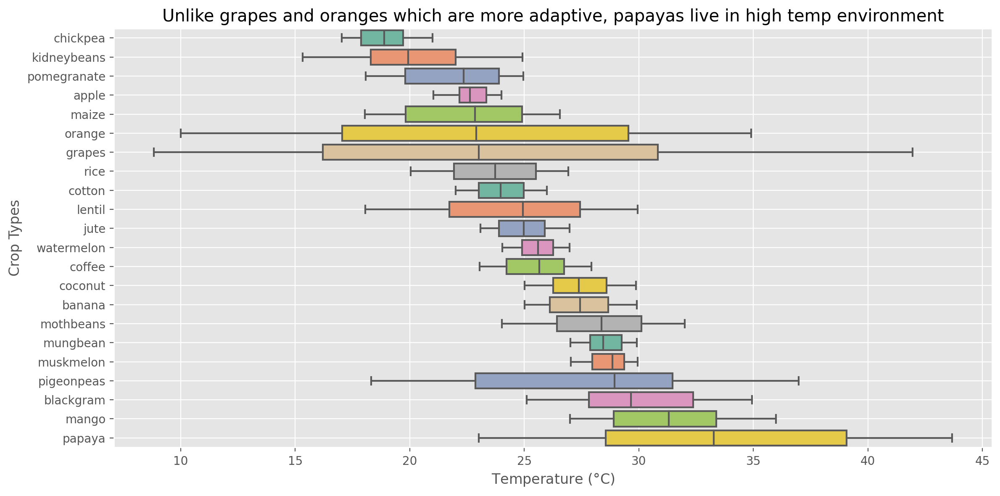

In [130]:
medians = data.groupby('label')['temperature'].median().sort_values()
sorted_labels = medians.index

fig, ax = plt.subplots(figsize=(12, 6), dpi=200)
sns.boxplot(y='label', x='temperature', data=data, order=sorted_labels, palette='Set2', ax=ax)
ax.grid(True)
ax.set_title('Unlike grapes and oranges which are more adaptive, papayas live in high temp environment')
ax.set_xlabel('Temperature ($\degree$C)')
ax.set_ylabel('Crop Types')
plt.tight_layout()
plt.show()

**Note**
- Papayas typically live in higher temperatures. As can be seen the range of temperatures in which papayas grow are between approx 23 and 44 degree Celcius. 
- While grapes and oranges which have outliers in the overall temperatures have lower temperatures than papayas, they have wider range of temperatures than papayas, suggesting that they are more adaptable to an environment with varying temperatures.

#### **3.3.2 What causes outliers in rainfall level?**

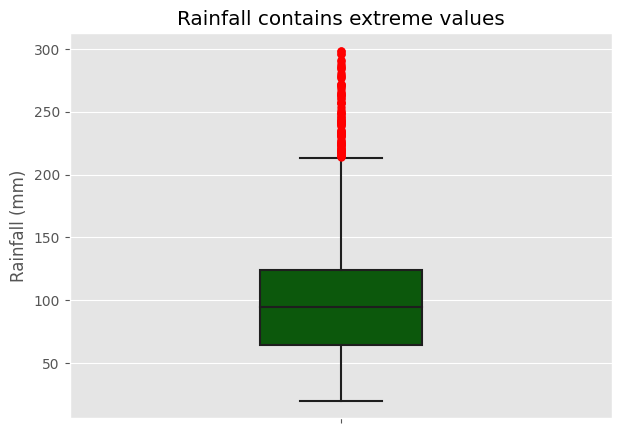

In [131]:
plt.figure(figsize=(7, 5), dpi=100)
sns.boxplot(y=data['rainfall'], color='darkgreen', width=0.3, 
            flierprops=dict(marker='.', markerfacecolor='red', 
                            markeredgecolor='red', alpha=1, 
                            markersize=10))

plt.title('Rainfall contains extreme values')
plt.ylabel('Rainfall (mm)')
plt.show()

In [132]:
q1 = data['rainfall'].quantile(0.25)
q3 = data['rainfall'].quantile(0.75)
iqr = q3 - q1
upper_threshold = q3 + 1.5 * iqr
data[(data['rainfall'] > upper_threshold)]['label'].value_counts()

rice       68
papaya     17
coconut    15
Name: label, dtype: int64

**Note**: As the boxplot indicates only on the top-end of the distribution has outliers, I only located crops which are on the upper end of the distribution, namely rice, papayas and coconut. To understand further about the top-end outliers, I will compare these crops with other crops.

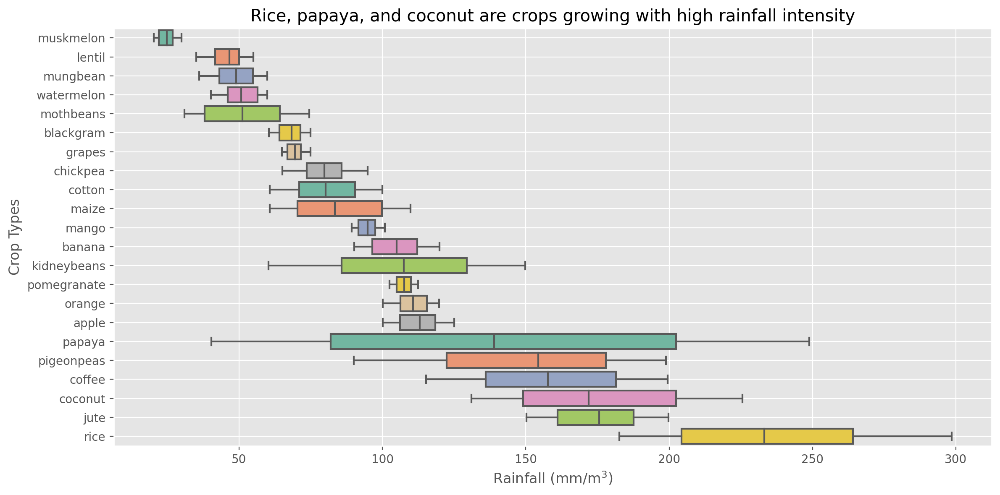

In [133]:
medians = data.groupby('label')['rainfall'].median().sort_values()
sorted_labels = medians.index

fig, ax = plt.subplots(figsize=(12, 6), dpi=200)
sns.boxplot(y='label', x='rainfall', data=data, order=sorted_labels, palette='Set2', ax=ax)
ax.grid(True)
ax.set_title('Rice, papaya, and coconut are crops growing with high rainfall intensity')
ax.set_xlabel('Rainfall (mm/m$^3$)')
ax.set_ylabel('Crop Types')
plt.tight_layout()
plt.show()

**Note**: The barplots above clarifies why there are outliers in three crop types, namely rice, coconut,and papaya. Based on the data visualization, it is clear that these three crops can grow in an evinronment with high rainfall intensity. Specifically for rice, this crop can grow when the rainfall intensity is between around 180 and 300mm/m-qubic. This is reasonable because rice needs watery environment to grow. The outliers as a consequence represent the genuine data about these crops.

#### **3.3.3 What causes outliers in acidity (pH) level?**

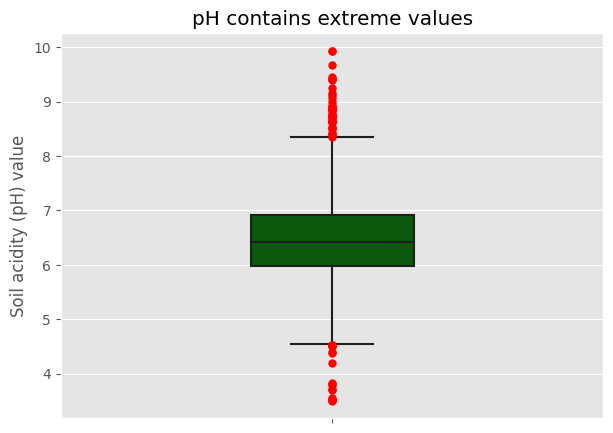

In [134]:
plt.figure(figsize=(7, 5))
sns.boxplot(y=data['ph'], color='darkgreen', width=0.3, 
            flierprops=dict(marker='.', markerfacecolor='red', 
                            markeredgecolor='red', alpha=1, 
                            markersize=10))

plt.title('pH contains extreme values')
plt.ylabel('Soil acidity (pH) value')
plt.show()

In [135]:
q1 = data['ph'].quantile(0.25)
q3 = data['ph'].quantile(0.75)
iqr = q3 - q1
upper_threshold = q3 + 1.5 * iqr
lower_threshold = q1 - 1.5 * iqr
lower_count = data[(data['ph'] < lower_threshold)]['label'].value_counts()
higher_count = data[(data['ph'] > upper_threshold)]['label'].value_counts()
print('Outliers in low-end of the distribution:')
display(lower_count.reset_index(name='count'))
print('\nOutliers in high-end of the distribution:')
display(higher_count.reset_index(name='count'))

Outliers in low-end of the distribution:


,index,count
0,mothbeans,16
1,mango,2



Outliers in high-end of the distribution:


,index,count
0,mothbeans,26
1,chickpea,13


**Note**: The numerical and visual test suggest that the outliers occur in both high and low-end of the distribution of soil acidity. It means that some crops can live in either basic or acidic soil. And as informed by the numerical test, it turns out that only 2 mango plants can live in low pH soil and considering mothbeans show up both in the low and high end outliers, this may suggest that mothbeans can grow in soild with varying acidity level. To check this assumption, I will compare these extreme cases, including mothbeans, to other crops.

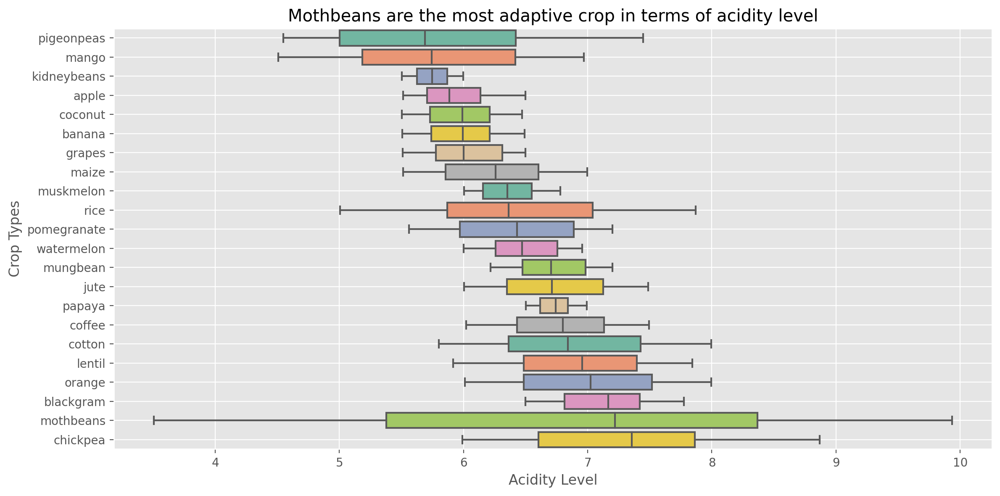

In [136]:
# compare chickpea to other plants
medians = data.groupby('label')['ph'].median().sort_values()
sorted_labels = medians.index

fig, ax = plt.subplots(figsize=(12, 6), dpi=200)
sns.boxplot(y='label', x='ph', data=data, order=sorted_labels, palette='Set2', ax=ax)
ax.grid(True)
ax.set_title('Mothbeans are the most adaptive crop in terms of acidity level')
ax.set_xlabel('Acidity Level')
ax.set_ylabel('Crop Types')
plt.tight_layout()
plt.show()

**Note**: In general, all crops typically grow in neutral soil with pH ranging between 6.5 and 7.5 (see range of medians below). Unlike other crops, mothbeans are the most adaptive crop since they can grow in basic soil and acidic soil. Due to their high adaptability to varying levels of acidity, mothbeans can grow in aciditic soil (pH < 7) by up to around 3 yet they can also live in alkaline soil (pH >7).

In [137]:
# compute range of medians in all crops
medians.reset_index(name='median').describe().transpose().round(2)

,count,mean,std,min,25%,50%,75%,max
median,22.0,6.47,0.51,5.69,6.0,6.45,6.83,7.36


#### **3.3.4 What causes outliers in humidity level?**

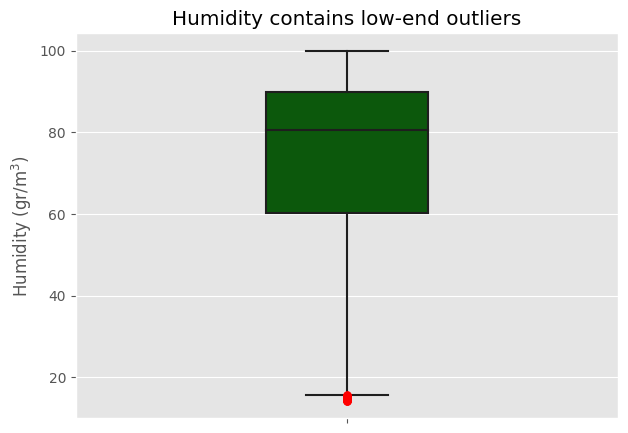

In [138]:
plt.figure(figsize=(7, 5))
sns.boxplot(y=data['humidity'], color='darkgreen', width=0.3, 
            flierprops=dict(marker='.', markerfacecolor='red', 
                            markeredgecolor='red', alpha=1, 
                            markersize=10))

plt.title('Humidity contains low-end outliers')
plt.ylabel('Humidity (gr/m$^3$)')
plt.show()

In [139]:
q1 = data['humidity'].quantile(0.25)
q3 = data['humidity'].quantile(0.75)
iqr = q3 - q1
lower_threshold = q1 - 1.5 * iqr
data[(data['humidity'] < lower_threshold)]['label'].value_counts()

chickpea    30
Name: label, dtype: int64

**Note**: Since the boxplot only indicates the presence of outliers in the low-end of the distribution, I checked only the lower distribution of humidity. This test suggests that there are 30 chickpea plants growing in an environment with low humidity. How extreme the humidity is remains unknown until a comparison between crop types are done.

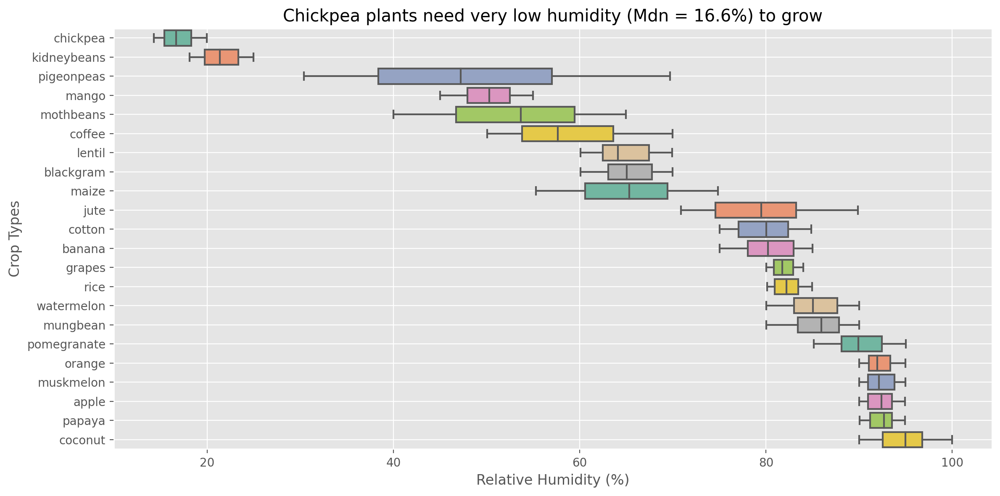

In [140]:
# compare chickpea to other plants
medians = data.groupby('label')['humidity'].median().sort_values()
sorted_labels = medians.index

fig, ax = plt.subplots(figsize=(12, 6), dpi=200)
sns.boxplot(y='label', x='humidity', data=data, order=sorted_labels, palette='Set2', ax=ax)
ax.grid(True)
ax.set_title('Chickpea plants need very low humidity (Mdn = 16.6%) to grow')
ax.set_xlabel('Relative Humidity (%)')
ax.set_ylabel('Crop Types')
plt.tight_layout()
plt.show()

**Note**: Almost a third number of chickpea plants (30 out of 100 instances) are outliers, and when looking closer to this plant type in the boxplot, it turns out that all chickpeas along with kidneybeans grow in a dry environment. When examining the humidity in general, some chickpeas are outliers but after closely investigating humidity by the crop types, the outliers represent genuine data.

#### **3.3.5 What causes outliers in phosphor?**

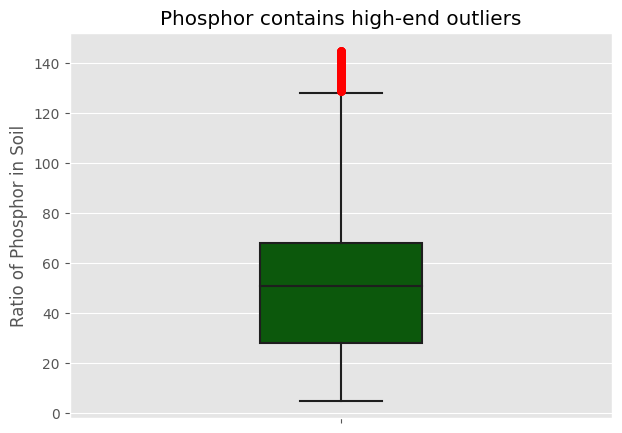

In [141]:
plt.figure(figsize=(7, 5))
sns.boxplot(y=data['P'], color='darkgreen', width=0.3, 
            flierprops=dict(marker='.', markerfacecolor='red', 
                            markeredgecolor='red', alpha=1, 
                            markersize=10))

plt.title('Phosphor contains high-end outliers')
plt.ylabel('Ratio of Phosphor in Soil')
plt.show()

In [142]:
q1 = data['P'].quantile(0.25)
q3 = data['P'].quantile(0.75)
iqr = q3 - q1
upper_threshold = q3 + 1.5 * iqr
data[data['P'] > upper_threshold]['label'].value_counts()

apple     70
grapes    68
Name: label, dtype: int64

**Note**: Out of 100 instances, more than a half instances of either grapes and apples are indicated as high-end outliers, meaning they are considered to grow in an environment with extreme ratio of phosphorous. It raises a question whether the high numbers of outliers represent genuine data similar to chickpeas which are more resistant in a dry environment.

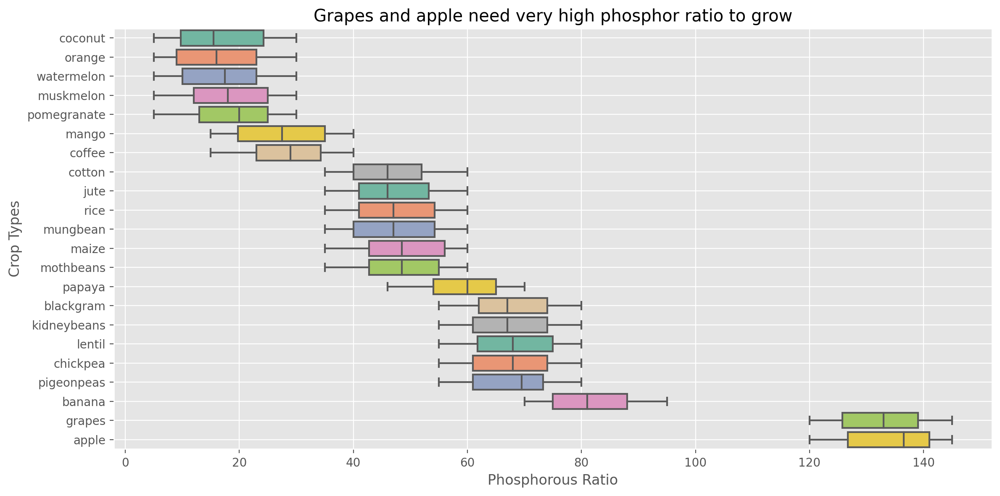

In [143]:
# compare chickpea to other plants
medians = data.groupby('label')['P'].median().sort_values()
sorted_labels = medians.index

fig, ax = plt.subplots(figsize=(12, 6), dpi=200)
sns.boxplot(y='label', x='P', data=data, order=sorted_labels, palette='Set2', ax=ax)
ax.grid(True)
ax.set_title('Grapes and apple need very high phosphor ratio to grow')
ax.set_xlabel('Phosphorous Ratio')
ax.set_ylabel('Crop Types')
plt.tight_layout()
plt.show()

**Note**
- It is interesting that some crops indicate shared patterns in terms of phosphorous ratio. First group represents several crop types with median phosphorous ratios around 20. The second one has median ratios approx 50. The third group with some variability has median phosphorous ratio around 70. And the last group, consisting of only two crop types, i.e., grapes and apples which have outliers, live in areas with high phosphorous ratio.
- Because the variability of the phosphorous ratios as shown by the short whiskers in apples and grapes, these two plants appear to be normally live in such conditions. Alternatively speaking, while previously, more than a half data in these two class were identified as outliers, they represent genuine values in which these two plant types grow.

#### **3.3.6 What causes outliers in potassium ratio in soil?**

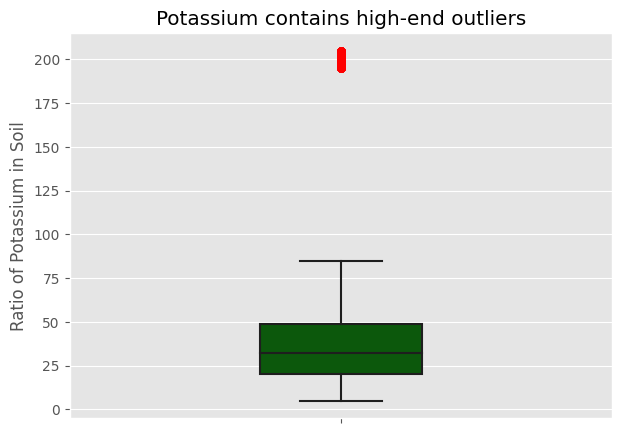

In [144]:
plt.figure(figsize=(7, 5))
sns.boxplot(y=data['K'], color='darkgreen', width=0.3, 
            flierprops=dict(marker='.', markerfacecolor='red', 
                            markeredgecolor='red', alpha=1, 
                            markersize=10))

plt.title('Potassium contains high-end outliers')
plt.ylabel('Ratio of Potassium in Soil')
plt.show()

In [145]:
q1 = data['K'].quantile(0.25)
q3 = data['K'].quantile(0.75)
iqr = q3 - q1
upper_threshold = q3 + 1.5 * iqr
data[data['K'] > upper_threshold]['label'].value_counts()

grapes    100
apple     100
Name: label, dtype: int64

**Note**: Grapes and apples are crop types which appear to be outliers in column potassium (`K`). In a closer examination, all instances falling in these two groups have significantly different potassium ratios required to grow in comparison to the rest crops. 

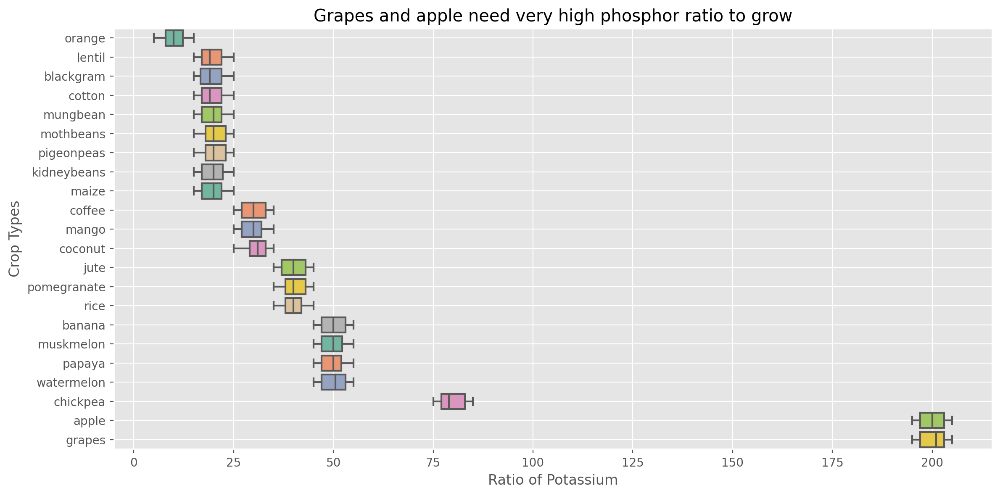

In [146]:
# compare chickpea to other plants
medians = data.groupby('label')['K'].median().sort_values()
sorted_labels = medians.index

fig, ax = plt.subplots(figsize=(12, 6), dpi=200)
sns.boxplot(y='label', x='K', data=data, order=sorted_labels, palette='Set2', ax=ax)
ax.grid(True)
ax.set_title('Grapes and apple need very high phosphor ratio to grow')
ax.set_xlabel('Ratio of Potassium')
ax.set_ylabel('Crop Types')
plt.tight_layout()
plt.show()

**Note**: Judging from the boxplot above, ratios of potassium required to grow grapes and apples are very high. These two plants do not only need high phosphorous and high humidity, but they also need high ratio of potassium. Because of these characteristics, these distinct features might distinguish grapes and apples from other crops. Whether this assumption is correct or not will be tested using Principal Component Analysis (PCA) later.

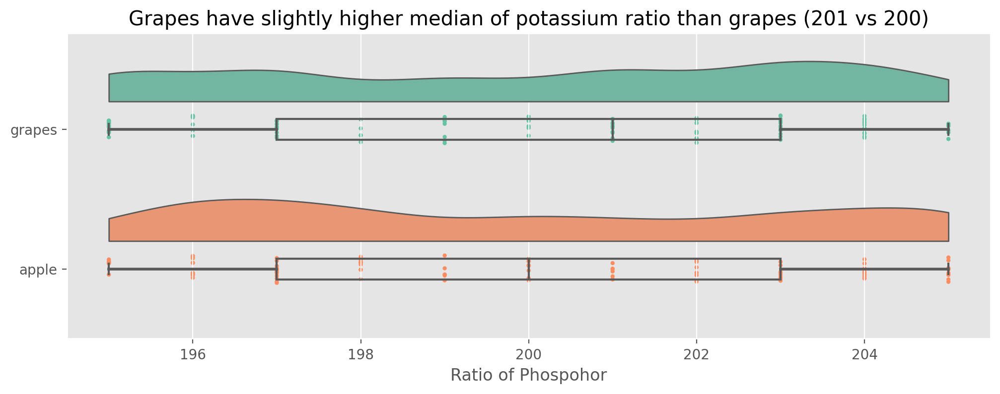

In [147]:
# filter the relevant subset
subset_df = data[data['label'].isin(['apple', 'grapes'])]
medians = subset_df.groupby('label')['K'].median().sort_values(ascending=True)
sorted_labels = medians.index

plt.figure(figsize=(12, 4), dpi=200)
pt.RainCloud(x='label', y='K', data=subset_df, 
             palette='Set2', bw=.2, width_viol=.6, orient='h')
plt.title('Grapes have slightly higher median of potassium ratio than grapes (201 vs 200)')
plt.xlabel('Ratio of Phospohor')
plt.ylabel(None)
plt.show()

### **3.4 Are there any highly correlated or multicollinear features?**

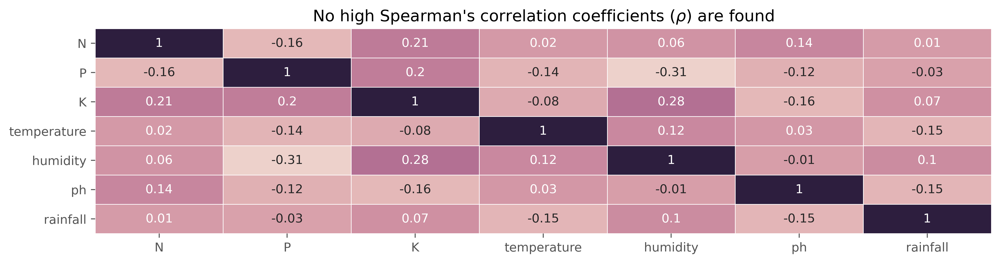

In [148]:
# build spearman correlation matrix
plt.figure(figsize=(13, 3), dpi=400)
correlation_matrix = data.corr(numeric_only=True, method='spearman').round(2)
sns.heatmap(correlation_matrix, annot=True, cmap=sns.cubehelix_palette(as_cmap=True), linewidths=0.5, cbar=False)
plt.title('No high Spearman\'s correlation coefficients ($\\rho$) are found', loc='center', fontsize=13)
plt.show()

**Note**
- The correlation matrix above was computed using Spearman's $\rho$. Spearman's correlation test was chosen over Pearson's $r$ test since the distributions of all numerical features are not normal. Unlike Pearson's correlation test, Spearman's correlation test does not assume normality in the data distribution.
- The correlation matrix suggests that there are no features with high correlation coefficients. The highest coefficient is only 0.31 for the humidity and phosphorous (P) pair.
- The small correlation coefficients across different numerical features might be a result of different possibilities such as small sample size, nonmonotonicity of relationship, and non-linearity. In this context, sample size should not be a culprit since the sample size is adequate for a statistical test but non-monotonous relationship and/or nonlinearity could be the reasons. 
- In short, Spearman's $\rho$ measures whether a bivariate relationship shows a consistent increase or decrease. The inconsistent interval between one data point to another can lead to low $\rho$ value. Additionally, even though Spearman's test captures monotonic relationship, complex relationship (non-linear) can be the other reason too.
- One simple way of testing the relationship between variables is using a scatter plot. But before visualizing the relationships, it is important to remember that Spearman's correlation test is a bivariate relationship test, especially for examining the strength and direction of a bivariate relationship. In order to test multicollinearity, a more formal tool should be used. In this case, I will use Variance Inflation Factor (VIF).

In [149]:
# add intercept for VIF calculation
X = data.select_dtypes(include='number')
X = add_constant(X)

# compute VIF for each feature
vif_data = pd.DataFrame()
vif_data['Feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

vif_data.round(4)

,Feature,VIF
0,const,127.0386
1,N,1.0970
2,P,2.6305
3,K,2.7971
4,temperature,1.1111
5,humidity,1.3690
6,ph,1.0558
7,rainfall,1.0374


**Note**
- In general, VIF values greater or equal to 5 should be avoided. When the values are greater or equal to 5, multicollinearity occurs in the dataset. This multicollinearity will pose a problem to a machine learning model because not only will it reduce the interpretability of the model, multicollinearity makes the coefficient estimate unstable.
    - When two or more predictors are highly correlated, determining the impact of individual predictor to the predictions is difficult. When evaluating a model, we typically look for a unique contribution of each predictor to the prediction but with multicollinearity, this uniqueness is hard to identify.
    - In terms of unstable coefficient estimates, small changes in data can lead to large changes in the coefficients (in linear-based model) or estimated values.
- And if multicollinearity happens, removing one of the highly correlated values can be the option.
- However, as can be seen, there are no VIF values equal to or greater than 5 so no need to drop any features for the predictive modeling process.

### **3.5 Why does the pairwise correlation matrix indicate low coefficients?**

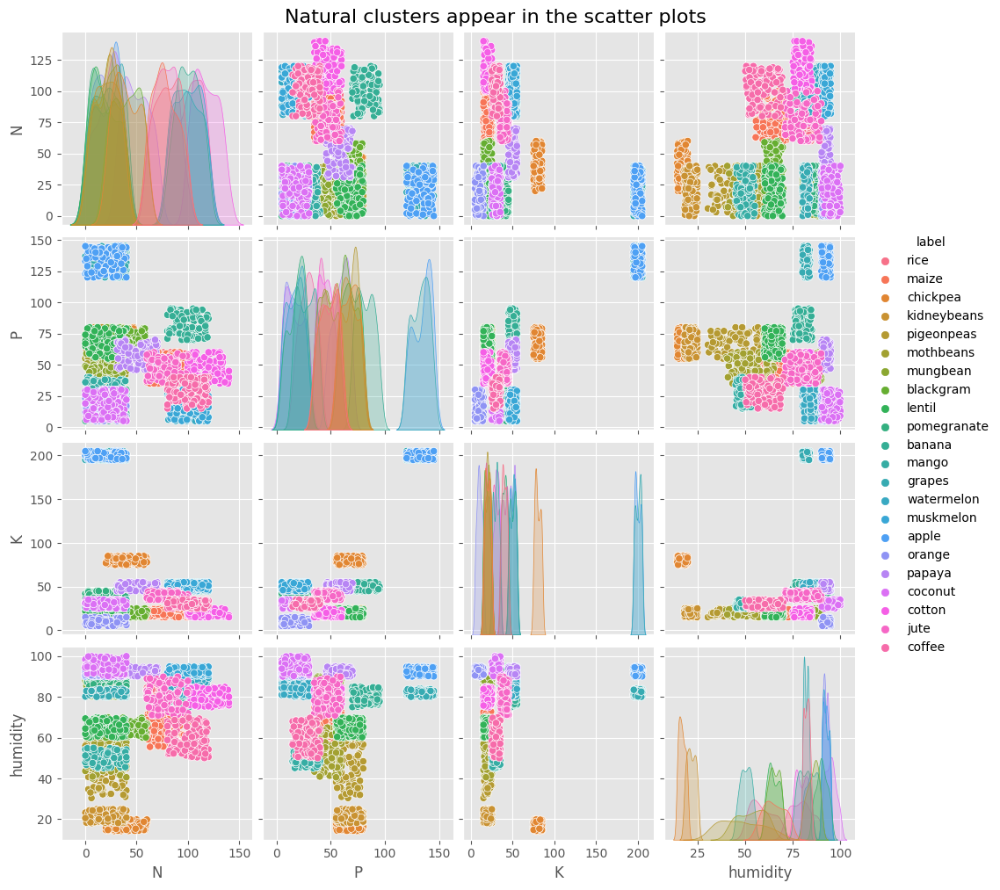

In [150]:
pairplot_data = data[['N', 'P', 'K', 'humidity', 'label']]
sns.pairplot(pairplot_data, hue='label', diag_kind='kde')
plt.suptitle('Natural clusters appear in the scatter plots', y=1.01, size=16)
plt.show()

**Note**
- When testing correlations using Spearman $\rho$, it was found that the highest correlation coefficients (despite their small magnitude (< 0.5)) are between phosphorous and humidity; potassium and humidity; and nitrogen and humidity. The small coefficients between these pairs were suspected to occur due to compex relationship between variables. To test this assumption, I used scatter plots.
- In the scatter plots above, it is shown that these pairs have complex relationships in which the data points are clustered instead of being scattered around the diagonal line. The question of why the highest correlation coefficients have small values has been answered here. But to give more details, I will perform a follow-up analysis on each pair to investigate the natural clusters, providing a more understanding on the patterns of each crop type.

#### **3.5.2 Phosphor vs Humidity**

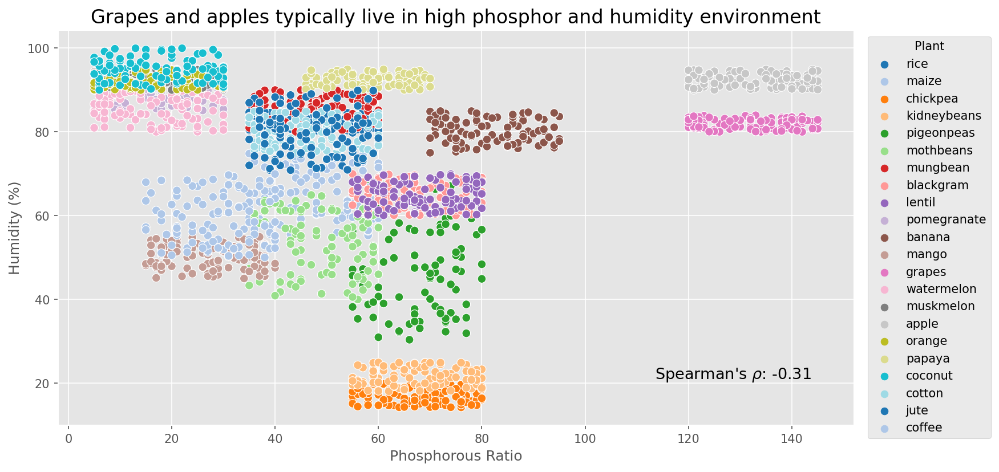

In [151]:
# compute spearman's rho
rho, p_value = stats.spearmanr(data['P'], data['humidity'])

plt.figure(figsize=(12, 6), dpi=150)
sns.scatterplot(x='P', y='humidity', hue='label', data=data, palette='tab20', s=50)

# coefficient
plt.text(x=0.75, y=0.15, s=f"Spearman's $\\rho$: {rho:.2f}", transform=plt.gca().transAxes,
         fontsize=13, verticalalignment='top', horizontalalignment='left', color='black')

plt.ylabel('Humidity (%)')
plt.xlabel('Phosphorous Ratio')
plt.title('Grapes and apples typically live in high phosphor and humidity environment', 
          size=16)
plt.legend(title='Plant', bbox_to_anchor=(1.01, 1), loc='upper left')
plt.show()

**Note**: The Spearman's correlation coefficient between phosphorous and humidity is small ($\rho$ = -0.31). This small coefficient is contributed by the complex relationship between these two features. Different plants tend to be clustered, and the data points for grapes and apples indicate the need for high relative humidity and high phosphorous ratio.

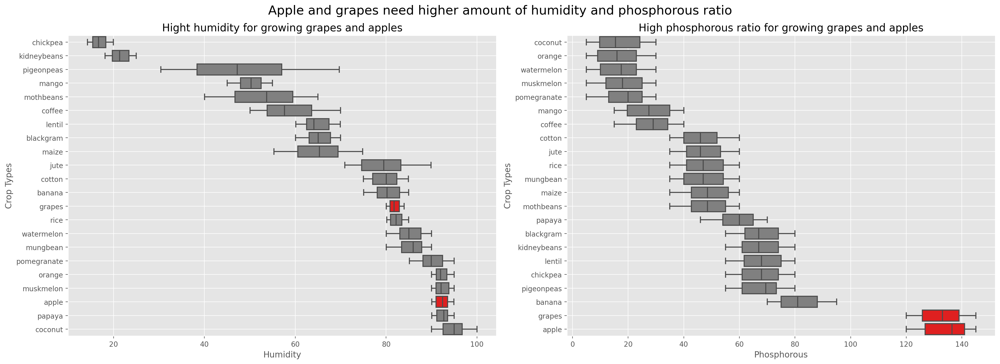

In [152]:
# create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 7), dpi=200)

# define the color palette
def custom_palette(label):
    if label in ['grapes', 'apple']:
        return 'red'
    else:
        return 'grey'

# ppply the custom palette 
palette = {label: custom_palette(label) for label in data['label'].unique()}

# plot 1: Humidity levels
medians_humidity = data.groupby('label')['humidity'].median().sort_values()
sorted_labels_humidity = medians_humidity.index
sns.boxplot(y='label', x='humidity', data=data, order=sorted_labels_humidity, palette=palette, ax=ax1)
ax1.grid(True)
ax1.set_title('Hight humidity for growing grapes and apples', size=15)
ax1.set_xlabel('Humidity')
ax1.set_ylabel('Crop Types')

# plot 2: Phosphorous ratio
medians_phosphorous = data.groupby('label')['P'].median().sort_values()
sorted_labels_phosphorous = medians_phosphorous.index
sns.boxplot(y='label', x='P', data=data, order=sorted_labels_phosphorous, palette=palette, ax=ax2)
ax2.grid(True)
ax2.set_title('High phosphorous ratio for growing grapes and apples', size=15)
ax2.set_xlabel('Phosphorous')
ax2.set_ylabel('Crop Types')

# prevent overlap
plt.tight_layout()
plt.suptitle('Apple and grapes need higher amount of humidity and phosphorous ratio', size=18, y=1.03)
plt.show()

#### **3.5.1 Phosphor (P) vs Potassium (K)**

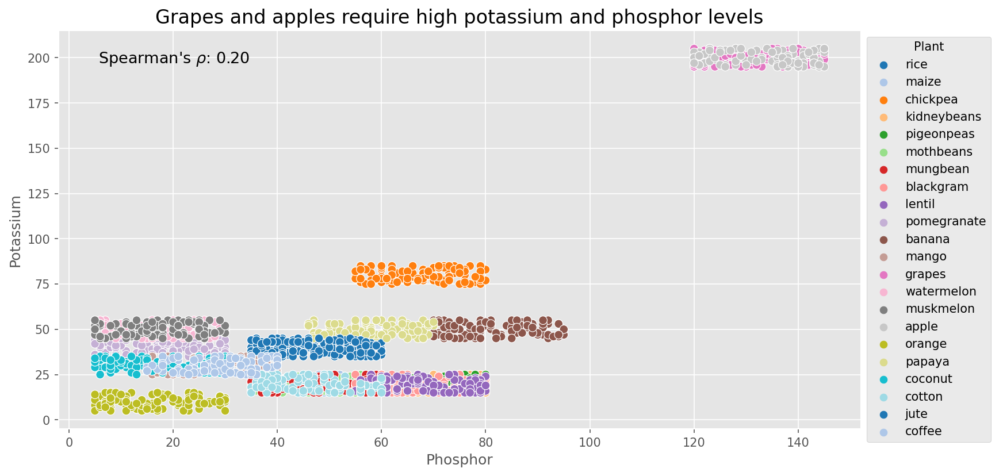

In [153]:
# compute spearman's rho
rho, p_value = stats.spearmanr(data['P'], data['K'])

plt.figure(figsize=(12, 6), dpi=150)
sns.scatterplot(x='P', y='K', hue='label', data=data, palette='tab20', s=50)
# square = patches.Rectangle((117,190), width=31, height=20, linewidth=1, edgecolor='red', facecolor='none')
# plt.gca().add_patch(square)
# plt.text(x=132, y=184, s='Grapes & Apples', color='red', fontsize=10, ha='center', va='center')

# add coefficient
plt.text(x=0.05, y=0.95, s=f"Spearman's $\\rho$: {rho:.2f}", transform=plt.gca().transAxes,
         fontsize=13, verticalalignment='top', horizontalalignment='left', color='black')

plt.ylabel('Potassium')
plt.xlabel('Phosphor')
plt.title('Grapes and apples require high potassium and phosphor levels', size=16)
plt.legend(title='Plant', bbox_to_anchor=(1, 1), loc='upper left')
plt.show()

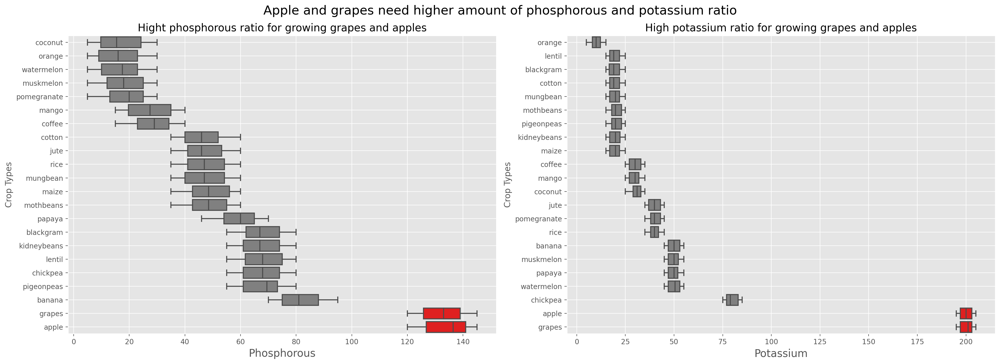

In [154]:
# create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 7), dpi=200)

# apply the custom palette 
palette = {label: custom_palette(label) for label in data['label'].unique()}

# plot 1: Phosphorous 
medians_phosphorous = data.groupby('label')['P'].median().sort_values()
sorted_labels_phosphorous = medians_phosphorous.index
sns.boxplot(y='label', x='P', data=data, order=sorted_labels_phosphorous, palette=palette, ax=ax1)
ax1.grid(True)
ax1.set_title('Hight phosphorous ratio for growing grapes and apples', size=15)
ax1.set_xlabel('Phosphorous', size=15)
ax1.set_ylabel('Crop Types')

# plot 2: Potassium ratio
medians_potassium= data.groupby('label')['K'].median().sort_values()
sorted_labels_ppotassium = medians_potassium.index
sns.boxplot(y='label', x='K', data=data, order=sorted_labels_ppotassium, palette=palette, ax=ax2)
ax2.grid(True)
ax2.set_title('High potassium ratio for growing grapes and apples', size=15)
ax2.set_xlabel('Potassium', size=15)
ax2.set_ylabel('Crop Types')

# prevent overlap
plt.tight_layout()
plt.suptitle('Apple and grapes need higher amount of phosphorous and potassium ratio', size=18, y=1.03)
plt.show()

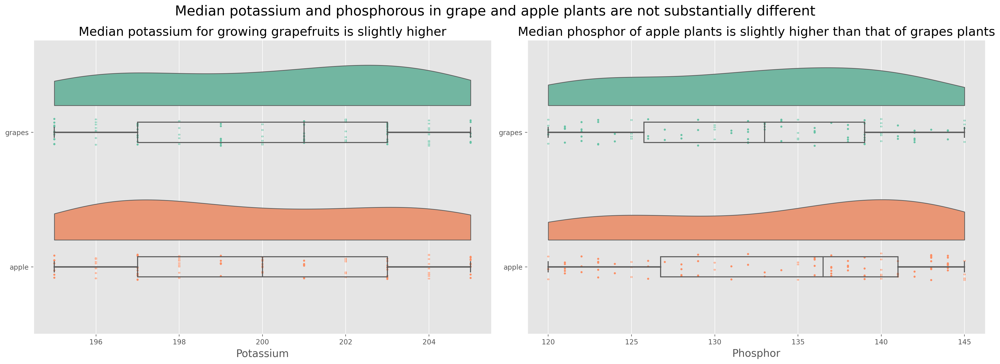

In [155]:
# create a subset of the data for 'grapes' and 'apple'
subset_df = data[data['label'].isin(['grapes', 'apple'])]

# set up the figure with two subplots 
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 7), dpi=200)

# plot 1: Potassium distribution
pt.RainCloud(x='label', y='K', data=subset_df, 
             palette='Set2', bw=.5, width_viol=.6, ax=ax1, orient='h')
ax1.set_title('Median potassium for growing grapefruits is slightly higher', size=18)
ax1.set_xlabel('Potassium', size=15)
ax1.set_ylabel(None)

# plot 2: Phosphorous distribution
pt.RainCloud(x='label', y='P', data=subset_df, 
             palette='Set2', bw=.5, width_viol=.6, ax=ax2, orient='h')
ax2.set_title('Median phosphor of apple plants is slightly higher than that of grapes plants', size=18)
ax2.set_xlabel('Phosphor', size=15)
ax2.set_ylabel(None)

plt.tight_layout()
plt.suptitle('Median potassium and phosphorous in grape and apple plants are not substantially different', y=1.04, size=20)
plt.show()

#### **3.8.3 Potassium vs Humidity**

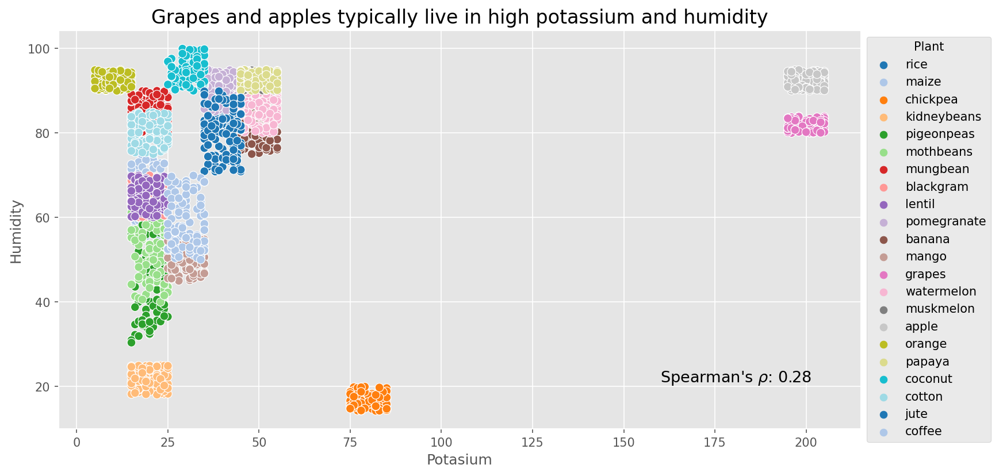

In [156]:
# compute spearman's rho
rho, p_value = stats.spearmanr(data['K'], data['humidity'])

plt.figure(figsize=(12, 6), dpi=150)
sns.scatterplot(x='K', y='humidity', hue='label', data=data, palette='tab20', s=50)

# coefficient
plt.text(x=0.75, y=0.15, s=f"Spearman's $\\rho$: {rho:.2f}", transform=plt.gca().transAxes,
         fontsize=13, verticalalignment='top', horizontalalignment='left', color='black')

plt.ylabel('Humidity')
plt.xlabel('Potasium')
plt.title('Grapes and apples typically live in high potassium and humidity', size=16)
plt.legend(title='Plant', bbox_to_anchor=(1, 1), loc='upper left')
plt.show()

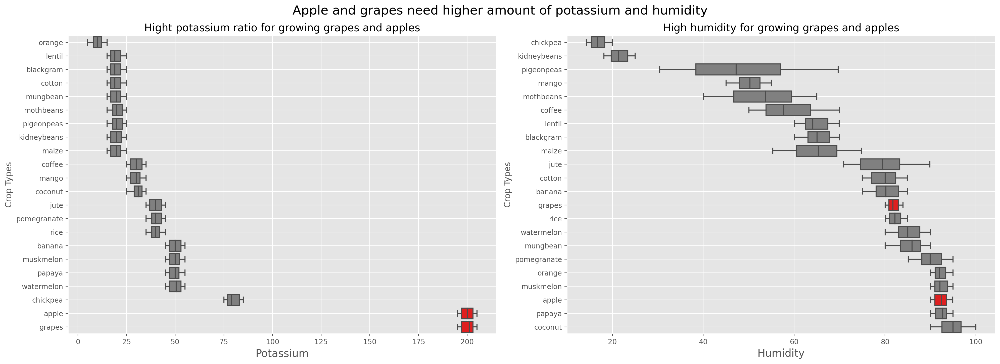

In [157]:
# create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 7), dpi=200)

# ppply the custom palette 
palette = {label: custom_palette(label) for label in data['label'].unique()}

# plot 1: Phosphorous 
medians_phosphorous = data.groupby('label')['K'].median().sort_values()
sorted_labels_phosphorous = medians_phosphorous.index
sns.boxplot(y='label', x='K', data=data, order=sorted_labels_phosphorous, palette=palette, ax=ax1)
ax1.grid(True)
ax1.set_title('Hight potassium ratio for growing grapes and apples', size=15)
ax1.set_xlabel('Potassium', size=15)
ax1.set_ylabel('Crop Types')

# plot 2: Potassium ratio
medians_potassium= data.groupby('label')['humidity'].median().sort_values()
sorted_labels_ppotassium = medians_potassium.index
sns.boxplot(y='label', x='humidity', data=data, order=sorted_labels_ppotassium, palette=palette, ax=ax2)
ax2.grid(True)
ax2.set_title('High humidity for growing grapes and apples', size=15)
ax2.set_xlabel('Humidity', size=15)
ax2.set_ylabel('Crop Types')

# prevent overlap
plt.tight_layout()
plt.suptitle('Apple and grapes need higher amount of potassium and humidity', size=18, y=1.03)
plt.show()

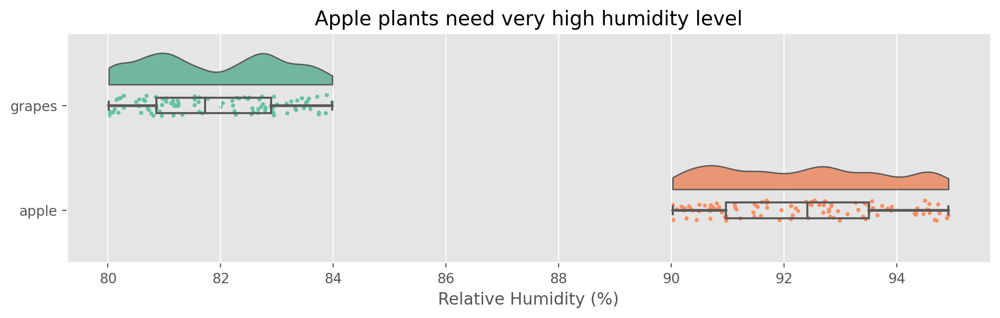

In [158]:
subset_df = data[data['label'].isin(['grapes', 'apple'])]

# set up the figure
plt.figure(figsize=(12, 3), dpi=200)
# use raincloud to display distribution
pt.RainCloud(x='label', y='humidity', data=subset_df, 
             palette='Set2', bw=.2, width_viol=.6, ax=None, orient='h')
plt.title('Apple plants need very high humidity level')
plt.xlabel('Relative Humidity (%)')
plt.ylabel(None)
plt.show()

#### **3.8.4 Nitrogen vs Potassium**

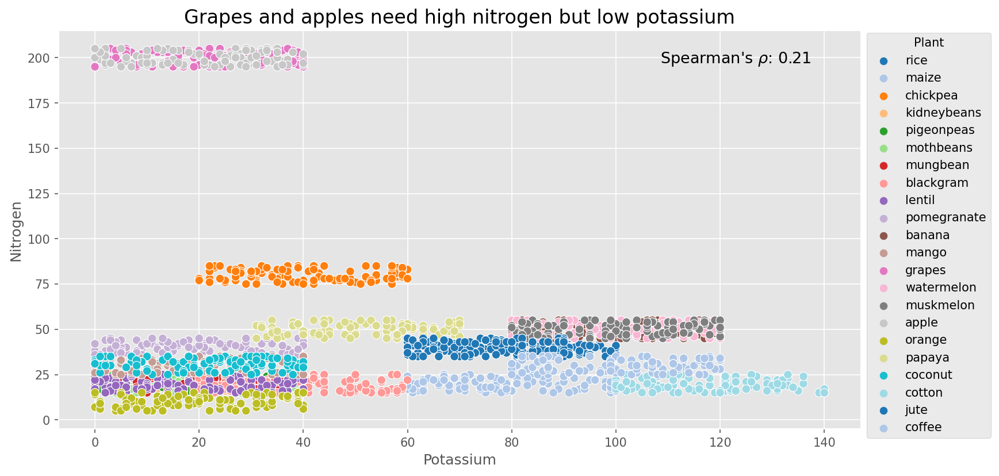

In [159]:
# compute spearman's rho
rho, p_value = stats.spearmanr(data['N'], data['K'])

plt.figure(figsize=(12, 6), dpi=150)
sns.scatterplot(x='N', y='K', hue='label', data=data, palette='tab20', s=50)

# coefficient
plt.text(x=0.75, y=0.95, s=f"Spearman's $\\rho$: {rho:.2f}", transform=plt.gca().transAxes,
         fontsize=13, verticalalignment='top', horizontalalignment='left', color='black')

plt.ylabel('Nitrogen')
plt.xlabel('Potassium')
plt.title('Grapes and apples need high nitrogen but low potassium', size=16)
plt.legend(title='Plant', bbox_to_anchor=(1, 1.01), loc='upper left')
plt.show()

#### **3.8.5 Phosphorous and pH**
As high acidity in soil can limit the availability of nutrients, especially phosphorous, I need to check the correlation between these two.

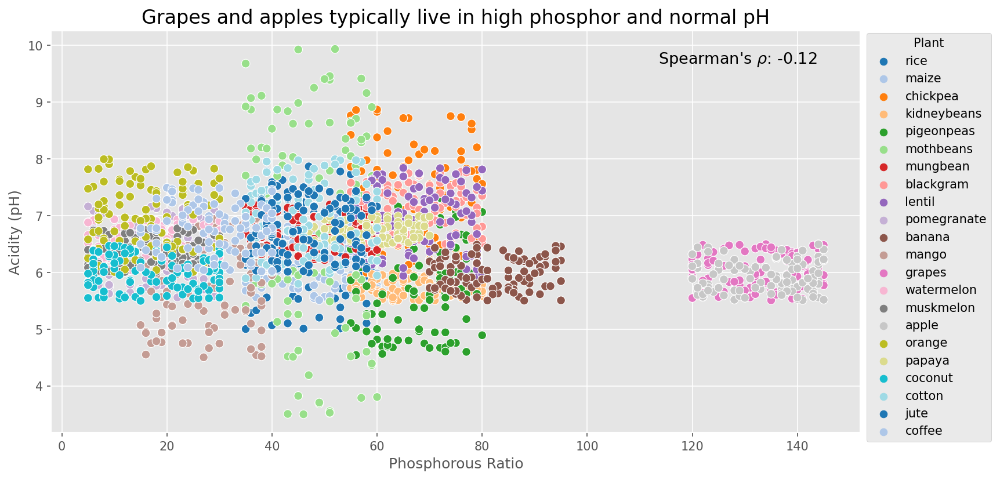

In [160]:
# compute spearman's rho
rho, p_value = stats.spearmanr(data['P'], data['ph'])

plt.figure(figsize=(12, 6), dpi=150)
sns.scatterplot(x='P', y='ph', hue='label', data=data, palette='tab20', s=50)

# coefficient
plt.text(x=0.75, y=0.95, s=f"Spearman's $\\rho$: {rho:.2f}", transform=plt.gca().transAxes,
         fontsize=13, verticalalignment='top', horizontalalignment='left', color='black')

plt.ylabel('Acidity (pH)')
plt.xlabel('Phosphorous Ratio')
plt.title('Grapes and apples typically live in high phosphor and normal pH', 
          size=16)
plt.legend(title='Plant', bbox_to_anchor=(1, 1.01), loc='upper left')
plt.show()

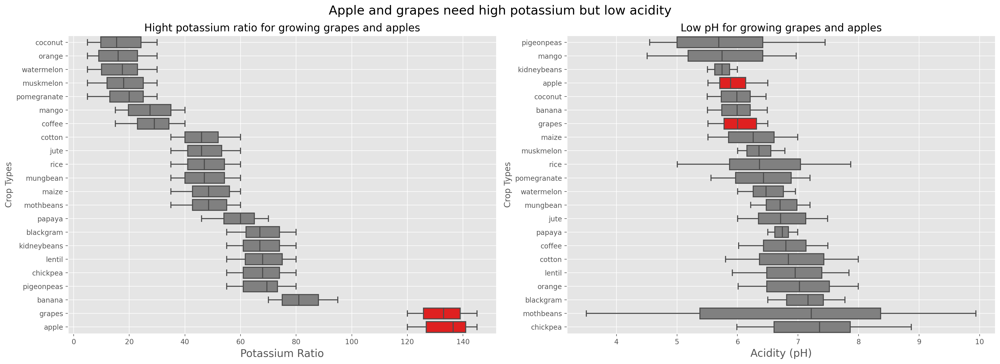

In [161]:
# create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 7), dpi=200)

# apply the custom palette 
palette = {label: custom_palette(label) for label in data['label'].unique()}

# plot 1: Phosphorous 
medians_phosphorous = data.groupby('label')['P'].median().sort_values()
sorted_labels_phosphorous = medians_phosphorous.index
sns.boxplot(y='label', x='P', data=data, order=sorted_labels_phosphorous, palette=palette, ax=ax1)
ax1.grid(True)
ax1.set_title('Hight potassium ratio for growing grapes and apples', size=15)
ax1.set_xlabel('Potassium Ratio', size=15)
ax1.set_ylabel('Crop Types')

# plot 2: pH
medians_potassium= data.groupby('label')['ph'].median().sort_values()
sorted_labels_ppotassium = medians_potassium.index
sns.boxplot(y='label', x='ph', data=data, order=sorted_labels_ppotassium, palette=palette, ax=ax2)
ax2.grid(True)
ax2.set_title('Low pH for growing grapes and apples', size=15)
ax2.set_xlabel('Acidity (pH)', size=15)
ax2.set_ylabel('Crop Types')

# prevent overlap
plt.tight_layout()
plt.suptitle('Apple and grapes need high potassium but low acidity', size=18, y=1.03)
plt.show()

### **3.6 Are there any potential anomalies?**
Principal Componant Analysis (henceforth, PCA) is useful in many ways, but most importantly in this exploration purpose, it makes possible visualizing high dimensional data into two dimensional space. By visualizing the reduced dimension, PCA helps in identifying whether there are natural groupings in the data. What I mean by 'natural' is without applying any clustering algorithms (e.g., k-means, DBSCAN, mean-shift, or agglomerative clustering). But it does not mean implementing a clustering algorithm is not beneficial when building a classification-based recommender for crop plantation. Performing clustering can provide a more comprehensive insight on the inherent patterns in the data which is not immediately apparents. On the other hand, to maintain simplicity, I will not perform any clustering in this notebook. I will keep this point to the future development in which clustering can be used as a triangulation tool to validate the classifier. If the recommender is effective enough, the results of the recommender should correspond with the outputs of the clustering.

In [162]:
# prepare the data for PCA
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(data['label'])
X = data.select_dtypes(include='number')
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X)

# combine PCA result with labels
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])
pca_df['label'] = data['label'].values
pca_df.head()

,PC1,PC2,label
0,-59.969729,84.055388,rice
1,-64.090628,107.779037,rice
2,-75.156888,142.468675,rice
3,-80.247626,117.340628,rice
4,-85.084925,137.343003,rice


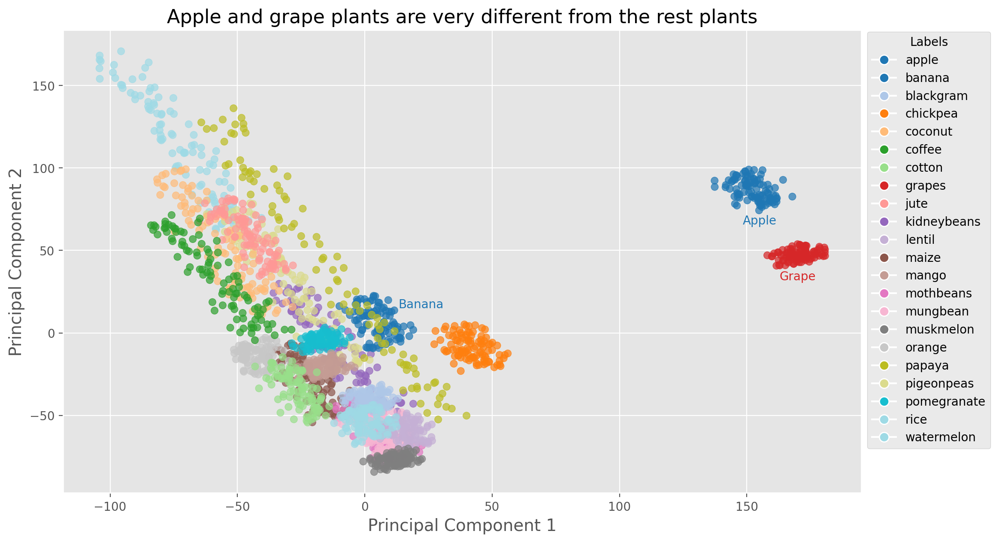

In [163]:
# plot using the encoded label
plt.figure(figsize=(12, 7), dpi=200)
scatter = plt.scatter(pca_result[:, 0], pca_result[:, 1], c=encoded_labels, cmap='tab20', alpha=0.7)
# plt.colorbar(scatter)  
plt.title('Apple and grape plants are very different from the rest plants', size=16)
plt.xlabel('Principal Component 1', size=14)
plt.ylabel('Principal Component 2', size=14)

# add a legend
unique_encoded_labels = np.unique(encoded_labels)
legend_labels = label_encoder.inverse_transform(unique_encoded_labels)
handles = [plt.Line2D([0], [0], marker='o', color='w', 
                      markerfacecolor=scatter.cmap(scatter.norm(i)), markersize=8) for i in unique_encoded_labels]
plt.text(x=155, y=68, s='Apple', color='#1f77b4', fontsize=10, ha='center', va='center')
plt.text(x=22, y=17, s='Banana', color='#1f77b4', fontsize=10, ha='center', va='center')
plt.text(x=170, y=34, s='Grape', color='#d62728', fontsize=10, ha='center', va='center')
plt.legend(handles, legend_labels, title='Labels', bbox_to_anchor=(1, 1.01))
plt.show()

**Note**
- Apple and grape plants are celarly separated from other plants, indicating unique characteristics compared to the rest plants. This insight confirms the previous findings about these two plants. For example, grapes and apples need high nitrogen, high humidity, high phosphor, and high potassium.
- Other plants are grouped closer togther, suggesting they share more similar features than differences.

In [164]:
import matplotlib.colors as mcolors

cmap = plt.colormaps['tab20']
colors = cmap.colors

# convert RGBA tuples to hex codes
hex_colors = [mcolors.to_hex(color) for color in colors]

# display hex codes
for i, hex_color in enumerate(hex_colors):
    print(f"Color {i+1}: {hex_color}")

Color 1: #1f77b4
Color 2: #aec7e8
Color 3: #ff7f0e
Color 4: #ffbb78
Color 5: #2ca02c
Color 6: #98df8a
Color 7: #d62728
Color 8: #ff9896
Color 9: #9467bd
Color 10: #c5b0d5
Color 11: #8c564b
Color 12: #c49c94
Color 13: #e377c2
Color 14: #f7b6d2
Color 15: #7f7f7f
Color 16: #c7c7c7
Color 17: #bcbd22
Color 18: #dbdb8d
Color 19: #17becf
Color 20: #9edae5


### **3.7 Summary**
This section attempts to explore the dataset, investigating the distributions of all features and target variable, and relationship between features along with the target variable. Using Shapiro-Wilk *W* test and IQR-based outlier detection method, I found that all features exhibit non-normal distributions and nearly all of them contain outliers. Nevertheless, after checking further, those outliers represent genuine data, not measurement errors or anomalies. Some crops type indeed require either very small or large amount of specific nutrients in the soil. In terms of correlations, I performed Spearman's correlation tests, suggesting no numerical features have high coefficients. The small magnitudes of correlations are caused by the complex patterns of data, showing clusters instead of scattering around a diagonal line. The impact of these insights is on the selection of robust scaling over min-max or standard scaling since the outliers represent genuine variability and important for making predictions. For more discussion on the selection of robust scaling, I will place it in the next section.

Equally imprtant, the exploratory data analysis also suggests that the distribution of classes in the target variable is balanced. This means that no feature engineering will be needed for balancing the target variable to avoid bias in the machine learning model.

## **4 Predictive Modeling**
In this section, I will compare several models based on several evaluation metrics, namely precision, accuracy, recall, F1 score (miroaverage), training time, and Hamming loss. Among these all, F1 score will be the main metric to evaluate the models' performance. F1 score, especially micro-averaged, is useful for <u>balanced multilabel dataset</u> by providing the overall performance. This metric is more considered than the macro-averaged version since the macro-averaged F1 sore evaluates the performance of models across individual labels. The macro-averaged version is more suitable for imbalanced labels because it treats all labels equally irrespective of the number of instances per label.
- **Precision**: Proportion of positive predictions out of all instances correctly classified as posisive.
$$\text{Precision}=\frac{TP}{TP + FP}$$
- **Recall**: proportion of actual positive instance out of all actual positive instances. 
$$\text{Recall}=\frac{TP}{TP+FN}$$
- **F1 score (micro-averaged)**: aggregating the contributions of all classes to compute the average performance. This metric takes both precision and recall into account.
$$\text{F1}_{\text{micro}} = \frac{2 \cdot \text{Precision}_{\text{micro}} \cdot \text{Recall}_{\text{micro}}}{\text{Precision}_{\text{micro}} + \text{Recall}_{\text{micro}}}$$
- **Accuracy**: proportion of correctly classified instances out of all instances.
$$\text{Accuracy}=\frac{TP+TN}{TP+TN+FP+FN}$$
- **Hamming loss**: Average fraction (proportion) of incorrect labels across all instances. $N$ represents number of samples, and $L$ is the number of labels. $y_{i,j}$ denotes the tru label for sample $i$ and label $j$ where as that with hat ($\hat{y}$) represents the predicted label. $I$ refers to indicator function (1 for true and 0 for false).
$$\text{Hamming Loss}=\frac{1}{N}\sum_{i=1}^N\frac{1}{L}\sum_{j=1}^L I_{\{y_{i,j} \ne \hat{y}_{i,j}\}}$$
- **Training time**: Amount of time taken for training the model on the dataset. This is an essential metric to consider because when two models happen to have the similar F1, this metric serves as an additional tool to decide which model to select. Ideally, good model is that with high performance score (in this case F1) and shorter training time.

### **4.1 Machine Learning Setup**
Before performing a comparison of performance scores across different models, I will firstly need to encode the labels in the target variable and split the dataset into training and test sets. Label encoding here transforms the categories or labels in column `label` into numbers. While similar to ordinal encoding, label encoding does not consider the order of the labels into account. The consideration of label encoding over ordinal encoding is importance since there is no natural ordering the label. For example, label apple is no more important than label grape.

After the dataset splitting, I will construct a preprocessor pipeline to convert the dataset into the desired input for the machine learning models. Since there are no categorical features, the pipeline will only consist of numerical preprocessor to scale the range of values across features. The scaling is critical to prevent the machine learning models from wighting features with greater values. And to do the scaling, I perform robust scaling. As previously mentioned in Section 3.7, the outliers are not anomalies in some instances but they represent genuine variability. Robust scaling is changing the scales of the numerical features without overly diminishing the big values. This is expected since the big values are important for predicting specific classes.

In [165]:
# encode target
label_encoder = LabelEncoder()
data['label'] = label_encoder.fit_transform(data['label'])

# define features and target
X = data.drop(columns=['label'])
y = data['label']

# split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f'The X_train consists of {X_train.shape[0]} rows and {X_train.shape[1]} columns')
print(f'The y_train consists of {y_train.shape[0]} rows')
print(f'X_test consists of {X_test.shape[0]} rows and {X_test.shape[1]} columns')
print(f'The y_test consists of {y_test.shape[0]} rows')

The X_train consists of 1760 rows and 7 columns
The y_train consists of 1760 rows
X_test consists of 440 rows and 7 columns
The y_test consists of 440 rows


In [166]:
# preprocessor pipeline 
num_cols = ['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall']
preprocessor = ColumnTransformer(
    transformers=[
        ('num', RobustScaler(), num_cols)
], remainder='passthrough')

# display preprocessor
display(preprocessor)

ColumnTransformer(remainder='passthrough',
                  transformers=[('num', RobustScaler(),
                                 ['N', 'P', 'K', 'temperature', 'humidity',
                                  'ph', 'rainfall'])])

In [167]:
# specify models for comparison
classifiers = [
    ('Logistic Regression', LogisticRegression(solver='liblinear', random_state=42)),
    ('K-Nearest Neighbors', KNeighborsClassifier()),
    ('Support Vector Machine', SVC(probability=True)),
    ('Decision Tree', DecisionTreeClassifier(random_state=42)),
    ('Random Forest', RandomForestClassifier(random_state=42)),
    ('Gradient Boosting', GradientBoostingClassifier(random_state=42)),
    ('AdaBoost', AdaBoostClassifier(random_state=42)),
    ('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)),
    ('CatBoost', CatBoostClassifier(verbose=0, random_state=42))
]

# assemble everything in a pipeline
pipelines = [(name, Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', model)
])) for name, model in classifiers]

# Scoring metrics
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score, average='micro', zero_division=0),
    'recall': make_scorer(recall_score, average='micro', zero_division=0),
    'f1': make_scorer(f1_score, average='micro', zero_division=0),
    'hammingloss': make_scorer(hamming_loss)
}

# Stratified k-fold cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

### **4.2 Model Comparison**

In [168]:
# evaluate each model
results = []
for name, pipeline in pipelines:
    scores = {}
    start_time = time.time()
    for metric_name, scorer in scoring.items():
        cv_results = cross_validate(pipeline, X_train, y_train, cv=skf, 
                                    scoring=scorer, n_jobs=-1)
        scores[f"{metric_name}"] = np.mean(cv_results['test_score'])
        scores[f"{metric_name}_sd"] = np.std(cv_results['test_score'])
    end_time = time.time()
    training_time = end_time - start_time
    scores['training_time'] = training_time
    results.append((name, scores))

# show in df
results_df = pd.DataFrame(results, columns=['Model', 'Scores'])
scores_df = results_df['Scores'].apply(pd.Series)
results_df = pd.concat([results_df[['Model']], scores_df], axis=1).round(3)
results_df = results_df.set_index('Model')

In [169]:
# display comparison output
results_df.sort_values(by=['f1', 'precision', 'recall'], ascending=False)

,accuracy,accuracy_sd,precision,precision_sd,recall,recall_sd,f1,f1_sd,hammingloss,hammingloss_sd,training_time
Model,,,,,,,,,,,
Random Forest,0.994,0.003,0.994,0.003,0.994,0.003,0.994,0.003,0.006,0.003,1.201
CatBoost,0.993,0.003,0.993,0.003,0.993,0.003,0.993,0.003,0.007,0.003,92.696
Gradient Boosting,0.990,0.001,0.990,0.001,0.990,0.001,0.990,0.001,0.010,0.001,29.461
Decision Tree,0.985,0.005,0.985,0.005,0.985,0.005,0.985,0.005,0.015,0.005,0.120
XGBoost,0.985,0.002,0.985,0.002,0.985,0.002,0.985,0.002,0.015,0.002,1.116
K-Nearest Neighbors,0.982,0.005,0.982,0.005,0.982,0.005,0.982,0.005,0.018,0.005,0.161
Support Vector Machine,0.982,0.008,0.982,0.008,0.982,0.008,0.982,0.008,0.018,0.008,0.762
Logistic Regression,0.947,0.007,0.947,0.007,0.947,0.007,0.947,0.007,0.053,0.007,3.508
AdaBoost,0.165,0.022,0.165,0.022,0.165,0.022,0.165,0.022,0.835,0.022,0.700


**Note**
- Above is a dataframe output for comparing the performance of different models based on their evaluation metrics.
- Based on the output, Random Rorest model is the top-performing model with F1 score of 0.994 $\pm$ 0.003, surpassing the performance of boosting-related models such as CatBoost, Gradient Boosting, XGBoost, or AdaBoost. This performance score is almost perfect since the range of scores in F1 is between 0 and 1.
- In addition to this F1 score, other evaluation metrics also indicate excellent performance. For instance, the accuracy rate is exactly the same as the F1 score with the training time relatively fast in comparison to more advanced models such as CatBoost or Gradient Boosting.
- Considering these evaluation metrics, I will move forward with Random Forest.

### **4.3 Model Creation**

In [170]:
# build pipelines
rf_clf = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(n_estimators=100, random_state=42))
])

display(rf_clf)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num', RobustScaler(),
                                                  ['N', 'P', 'K', 'temperature',
                                                   'humidity', 'ph',
                                                   'rainfall'])])),
                ('classifier', RandomForestClassifier(random_state=42))])

In [171]:
scoring = {
    'accuracy': 'accuracy',
    'f1': 'f1_micro',  
    'recall': 'recall_micro',  
    'precision': 'precision_micro',  
    'hamming_loss': make_scorer(hamming_loss)  
}

# perform cross-validation
cv_results = cross_validate(rf_clf, X_train, y_train, cv=skf, 
                            scoring=scoring, return_train_score=True)

# store results in df
rf_score_df = pd.DataFrame({
    'Fold': range(1, skf.get_n_splits() + 1),
    'Train Accuracy': cv_results['train_accuracy'],
    'Test Accuracy': cv_results['test_accuracy'],
    'Train F1 Score': cv_results['train_f1'],
    'Test F1 Score': cv_results['test_f1'],
    'Train Recall': cv_results['train_recall'],
    'Test Recall': cv_results['test_recall'],
    'Train Precision': cv_results['train_precision'],
    'Test Precision': cv_results['test_precision'],
    'Train HLoss': cv_results['train_hamming_loss'],
    'Test HLoss': cv_results['test_hamming_loss'],
    'TT': cv_results['fit_time']
})

# calculate mean and SD
mean_accuracy = rf_score_df['Test Accuracy'].mean()
std_accuracy = rf_score_df['Test Accuracy'].std()
mean_f1 = rf_score_df['Test F1 Score'].mean()
std_f1 = rf_score_df['Test F1 Score'].std()
mean_recall = rf_score_df['Test Recall'].mean()
std_recall = rf_score_df['Test Recall'].std()
mean_precision = rf_score_df['Test Precision'].mean()
std_precision = rf_score_df['Test Precision'].std()
mean_hamming_loss = rf_score_df['Test HLoss'].mean()
std_hamming_loss = rf_score_df['Test HLoss'].std()
mean_tt = rf_score_df['TT'].mean()
std_tt = rf_score_df['TT'].std()

# display the results
display(rf_score_df.round(4))
print("\nMean test accuracy: {:.4f} (Std: {:.4f})".format(mean_accuracy, std_accuracy))
print("Mean test F1 score: {:.4f} (Std: {:.4f})".format(mean_f1, std_f1))
print("Mean test recall: {:.4f} (Std: {:.4f})".format(mean_recall, std_recall))
print("Mean test precision: {:.4f} (Std: {:.4f})".format(mean_precision, std_precision))
print("Mean test Hamming loss: {:.4f} (Std: {:.4f})".format(mean_hamming_loss, std_hamming_loss))
print("Mean training time: {:.4f} (Std: {:.4f})".format(mean_tt, std_tt))

,Fold,Train Accuracy,Test Accuracy,Train F1 Score,Test F1 Score,Train Recall,Test Recall,Train Precision,Test Precision,Train HLoss,Test HLoss,TT
0,1,1.0,0.9972,1.0,0.9972,1.0,0.9972,1.0,0.9972,0.0,0.0028,0.2236
1,2,1.0,0.9886,1.0,0.9886,1.0,0.9886,1.0,0.9886,0.0,0.0114,0.1576
2,3,1.0,0.9915,1.0,0.9915,1.0,0.9915,1.0,0.9915,0.0,0.0085,0.1715
3,4,1.0,0.9972,1.0,0.9972,1.0,0.9972,1.0,0.9972,0.0,0.0028,0.1538
4,5,1.0,0.9943,1.0,0.9943,1.0,0.9943,1.0,0.9943,0.0,0.0057,0.1547



Mean test accuracy: 0.9938 (Std: 0.0037)
Mean test F1 score: 0.9938 (Std: 0.0037)
Mean test recall: 0.9938 (Std: 0.0037)
Mean test precision: 0.9938 (Std: 0.0037)
Mean test Hamming loss: 0.0063 (Std: 0.0037)
Mean training time: 0.1722 (Std: 0.0296)


**Note**: Across 5 folds, the performance of the Random Forest model shows stability as shown by the means of different metrics along with the standard deviations. For example, the F1 score is 0.9938 $\pm$ 0.0037, indicating excellent performance. This stability across different folds indicate that the model does not suffer from overfitting problem.

In [172]:
# evaluate the model
rf_clf.fit(X_train, y_train)
y_pred = rf_clf.predict(X_test)
print('F1 score: ', round(f1_score(y_test, y_pred, average='micro', zero_division=0), 4))
print("Hamming loss:", round(hamming_loss(y_test, y_pred), 4))

F1 score:  0.9932
Hamming loss: 0.0068


In [173]:
# show classification report
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

              precision    recall  f1-score   support

       apple       1.00      1.00      1.00        23
      banana       1.00      1.00      1.00        21
   blackgram       1.00      1.00      1.00        20
    chickpea       1.00      1.00      1.00        26
     coconut       1.00      1.00      1.00        27
      coffee       1.00      1.00      1.00        17
      cotton       1.00      1.00      1.00        17
      grapes       1.00      1.00      1.00        14
        jute       0.92      1.00      0.96        23
 kidneybeans       1.00      1.00      1.00        20
      lentil       0.92      1.00      0.96        11
       maize       1.00      1.00      1.00        21
       mango       1.00      1.00      1.00        19
   mothbeans       1.00      0.96      0.98        24
    mungbean       1.00      1.00      1.00        19
   muskmelon       1.00      1.00      1.00        17
      orange       1.00      1.00      1.00        14
      papaya       1.00    

**Note**: The model performs equally excellent in unseen data with F1 score of 0.9932. The accuracy score is also almost perfect (0.99). On the other hand, because F1 scores in some labels are not equally high, the model might perform worse in predicting some crops such as jute, lentil, and rice. Let us see whether hyperparameter tuning can improve the performance in these crops.

### **4.4 Hyperparameter Tuning**

In [174]:
# param_grid = {
#     'classifier__criterion': ['gini', 'entropy'],
#     'classifier__max_depth': [None, 10, 20, 30],
#     'classifier__min_samples_split': [2, 5, 10],
#     'classifier__min_samples_leaf': [1, 2, 4],
#     'classifier__max_features': [None, 'sqrt', 'log2']
# }

f1_scoring = make_scorer(f1_score, average='micro', zero_division=0)

param_grid = {
    'classifier__n_estimators': [100, 200, 300],
    'classifier__max_depth': [None, 10, 20, 30],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# set up GridSearchCV
grid_search = GridSearchCV(rf_clf, param_grid, cv=5, scoring=f1_scoring, n_jobs=-1)
grid_search.fit(X_train, y_train)

# display best parameters and score
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best cross-validation score (F1): {grid_search.best_score_:.4f}")

Best parameters: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 100}
Best cross-validation score (F1): 0.9949


**Note**
- Before performing hyperparameter tuning, I set up 4 types of hyperparameters, namely `n_estimators`, `max_depth`, `min_samples_split`, and `min_samples_leaf` (refer to the [docummentation](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html#randomforestclassifier) to learn more about the parameters). 
    - `n_estimators`: number of trees in the forest, ranging from 100 to 300 with step of 100.
    - `max_depth`: controls the max depth of the tree
    - `min_samples_spit`: the maximum depth of the tree
    - `min_samples_split`: the min numbr of samples required to split an internal node.
- Using GridSearchCV, the best parameters were found and the best model achieved F1 of 0.9949. This performance increased by 0.0017. This tiny amount of increase means that the model has been optimized for making predictions.

### **4.5 Best Model Evaluation**

#### **4.5.1 Classification Report**

In [175]:
# evaluate the model
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

              precision    recall  f1-score   support

       apple       1.00      1.00      1.00        23
      banana       1.00      1.00      1.00        21
   blackgram       1.00      1.00      1.00        20
    chickpea       1.00      1.00      1.00        26
     coconut       1.00      1.00      1.00        27
      coffee       1.00      1.00      1.00        17
      cotton       1.00      1.00      1.00        17
      grapes       1.00      1.00      1.00        14
        jute       0.92      1.00      0.96        23
 kidneybeans       1.00      1.00      1.00        20
      lentil       0.92      1.00      0.96        11
       maize       1.00      1.00      1.00        21
       mango       1.00      1.00      1.00        19
   mothbeans       1.00      0.96      0.98        24
    mungbean       1.00      1.00      1.00        19
   muskmelon       1.00      1.00      1.00        17
      orange       1.00      1.00      1.00        14
      papaya       1.00    

In [176]:
# calculate Hamming Loss
print("Hamming Loss:", round(hamming_loss(y_test, y_pred), 4))

Hamming Loss: 0.0068


**Note**: Since the F1 score before and after tuning does not show significant improvement, the performance scores for each class remains closely similar. Furthermore, the Hamming loss scores for both tuned and untuned models do not change at all (0.0068 vs 0.0068). The Hamming scores close to zero indicates thatthe model is almost perfectly predicted all labels for all samples. The similar scores in untuned and tuned models underscore that the model has been optimized.

#### **4.5.4 Learning Curve**

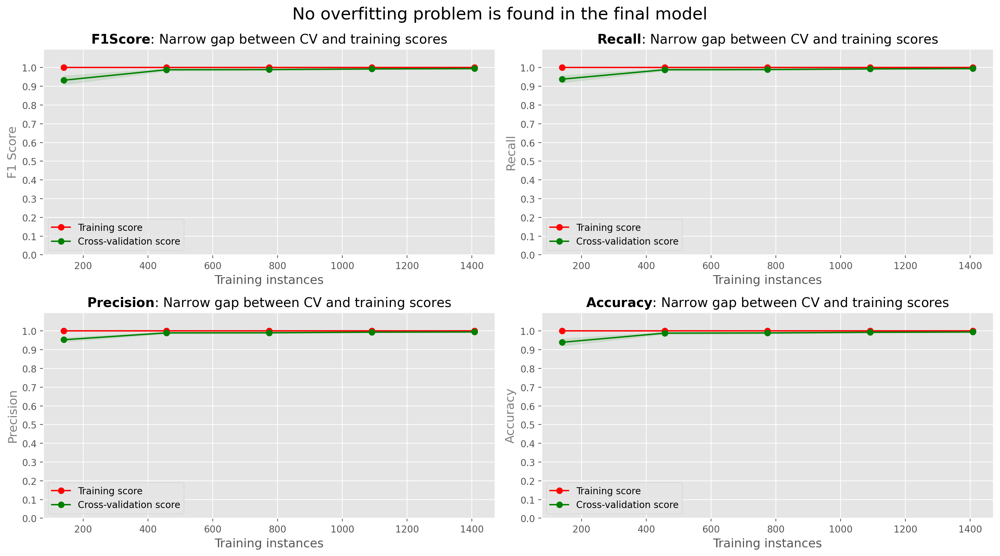

In [177]:
# define scorers
scoring = {
    'F1 Score': make_scorer(f1_score, average='macro', zero_division=0),
    'Recall': make_scorer(recall_score, average='macro', zero_division=0),
    'Precision': make_scorer(precision_score, average='macro', zero_division=0),
    'Accuracy': make_scorer(accuracy_score)
}

# init the figure and axis array
fig, axes = plt.subplots(2, 2, figsize=(15, 8), dpi=200)
axes = axes.ravel()  

# loop through each metric
for i, (metric_name, scorer) in enumerate(scoring.items()):
    train_sizes, train_scores, test_scores = learning_curve(
        best_model, X_train, y_train, cv=5, scoring=scorer, n_jobs=-1)
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    axes[i].fill_between(train_sizes, train_scores_mean - train_scores_std,
                         train_scores_mean + train_scores_std, alpha=0.1, color="r")
    axes[i].fill_between(train_sizes, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1, color="g")
    axes[i].plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    axes[i].plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")

    axes[i].set_xlabel('Training instances', size=13)
    axes[i].set_ylabel(metric_name, size=13, color='grey')
    axes[i].set_title(rf'$\bf{{{metric_name}}}$: Narrow gap between CV and training scores', size=14)
    axes[i].legend(loc="best")
    axes[i].set_ylim(0, 1.1)
    axes[i].set_yticks(np.arange(0, 1.1, 0.1))

plt.tight_layout()
plt.suptitle('No overfitting problem is found in the final model', 
             y=1.03, size=18)
plt.show()


**Note**
- Learning curve displays how a model performs measured by a specific metric ($y$-axis) as the training size increases ($x$-axis). In all learning curve plots above, there are two main components, namely training score line (<span style='color:red'>red line</span>) and the cross-validation score line (<span style='color:green'>green line</span>), indicating performance of the model. Ideally, a good model is that whose training and cross-validation score lines are close. The small gaps imply that the differences between training scores and CV scores as the training instances increase are similar. The model can generalize the patterns of data it learns from the training data to the unseen data (CV data). 
- As shown on four learning curves, the Random Forest model exhibit an excellent performance with very narrow gaps between training score lines and cross-validation score lines. With the narrow gaps, it can be inferred that the model does not suffer from the overfitting problem, confirming the small difference in F1 scores in training and test set. 

#### **4.5.5 Reliability Curve**

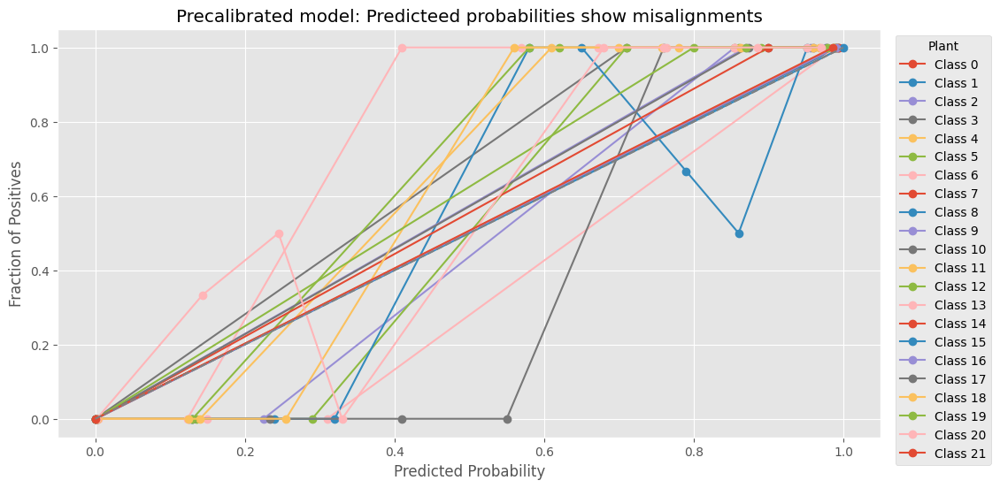

In [178]:
y_pred_proba = best_model.predict_proba(X_test)

# binarize the y_test for multiclass
y_test_binarized = label_binarize(y_test, classes=best_model.classes_)

# plot calibration curve for each class
plt.figure(figsize=(12, 6))

for i, class_label in enumerate(best_model.classes_):
    prob_true, prob_pred = calibration_curve(y_test_binarized[:, i], y_pred_proba[:, i], n_bins=10)
    
    plt.plot(prob_pred, prob_true, marker='o', label=f'Class {class_label}')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('Predicted Probability')
plt.ylabel('Fraction of Positives')
plt.title('Precalibrated model: Predicteed probabilities show misalignments')
# plt.legend(loc='best')
plt.legend(title='Plant', bbox_to_anchor=(1.01, 1), loc='upper left')
plt.show()

**Note**
- Reliability curve or calibration curve displays how well the predicted probabilities the model generate align with the fraction of positives. A well calibrated model will have lines which closely align with the diagonal line. This alignment indicates that the predicted prrobability closely matches the true probability. Nonetheless, if the lines are above the diagonal line, this misalignment implies that the model tends to underpredict the probability (predicts lower probabilities that it should). If the lines are below the diagonal line, the model is more likely to overpredict the probability. The model gives higher prediction when actually it should give lower.
- As indicated by the reliability plot above, the Random Forest model's predictions are misaligned, underscoring the need for model calibration either using sigmoid or isotonic function.
- Before calibrating morel, it is necessary to look at the model's performance since sometimes, the model calibration changes the model's predictions. Here, I will use a confusion matrix showing where the model makes mispredictions. 

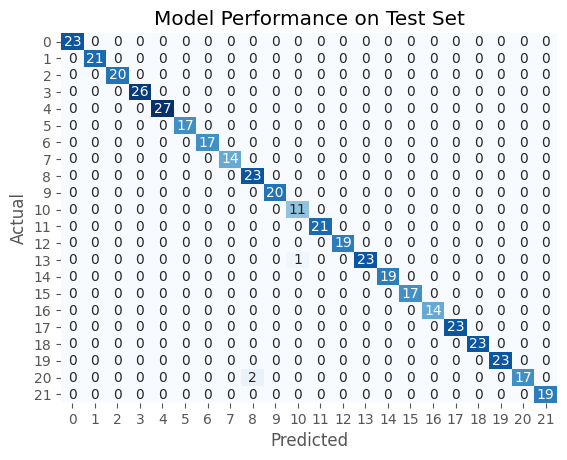

In [179]:
y_pred_dt = best_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred_dt)
ax = plt.subplot()
sns.heatmap(cm, annot=True, fmt='g', ax=ax, cmap='Blues', cbar=False)

ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
ax.set_title('Model Performance on Test Set')
plt.show()

**Note**: The model makes mispredictions in two classes. First, it predicts class 10 (lentil) when the actual class is mothbeans for once. Second, the model also misclassified two instances as class 8 (jute) when the actual class is rice (class 20). The errors here are not surprising since the classification report on the tuned models indicates lower scores in jute, lentil, mothbeans, and rice (see Section 4.5.1).

In [180]:
# display labels along with ther encodings
label_df = pd.read_csv('../data/Crop_recommendation.csv', usecols=['label'])
label_df['label_enc'] = label_encoder.fit_transform(label_df['label'])
label_df = label_df.drop_duplicates(keep='first').sort_values(by='label_enc')
label_df

,label,label_enc
1500,apple,0
1000,banana,1
700,blackgram,2
200,chickpea,3
1800,coconut,4
2100,coffee,5
1900,cotton,6
1200,grapes,7
2000,jute,8
300,kidneybeans,9


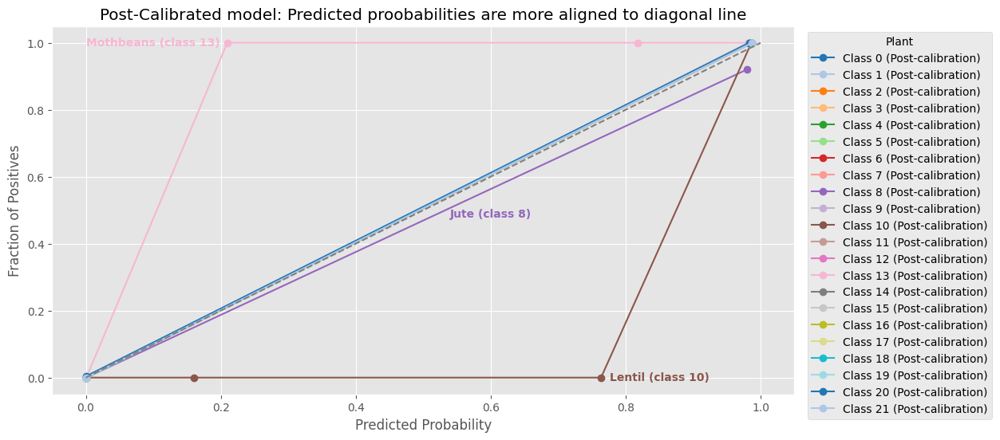

In [181]:
# calibrate the model
calibrated_model = CalibratedClassifierCV(estimator=best_model, method='sigmoid', cv='prefit')
calibrated_model.fit(X_train, y_train)

# predict post-calibrated probabilities on the test set
y_pred_proba_calibrated = calibrated_model.predict_proba(X_test)

# binarize the y_test for multiclass calibration curve
y_test_binarized = label_binarize(y_test, classes=best_model.classes_)

# define a colormap
cmap = plt.get_cmap('tab20')

# plot post-calibration calibration curve for each class
plt.figure(figsize=(12, 6))
for i, class_label in enumerate(best_model.classes_):
    color = cmap(i % 20)
    prob_true, prob_pred = calibration_curve(y_test_binarized[:, i], y_pred_proba_calibrated[:, i], n_bins=10)
    
    plt.plot(prob_pred, prob_true, marker='o', label=f'Class {class_label} (Post-calibration)', color=color)
plt.text(x=0.85, y=0, s='Lentil (class 10)', color='#8c564b', fontsize=10, ha='center', va='center', fontweight='bold')
plt.text(x=0.10, y=1, s='Mothbeans (class 13)', color='#f7b6d2', fontsize=10, ha='center', va='center', fontweight='bold')
plt.text(x=0.6, y=0.49, s='Jute (class 8)', color='#9467bd', fontsize=10, ha='center', va='center', fontweight='bold')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('Predicted Probability')
plt.ylabel('Fraction of Positives')
plt.title('Post-Calibrated model: Predicted proobabilities are more aligned to diagonal line')
plt.legend(title='Plant', bbox_to_anchor=(1.01, 1), loc='upper left')
plt.show()

In [182]:
for i, hex_color in enumerate(hex_colors):
    print(f"Color {i}: {hex_color}")

Color 0: #1f77b4
Color 1: #aec7e8
Color 2: #ff7f0e
Color 3: #ffbb78
Color 4: #2ca02c
Color 5: #98df8a
Color 6: #d62728
Color 7: #ff9896
Color 8: #9467bd
Color 9: #c5b0d5
Color 10: #8c564b
Color 11: #c49c94
Color 12: #e377c2
Color 13: #f7b6d2
Color 14: #7f7f7f
Color 15: #c7c7c7
Color 16: #bcbd22
Color 17: #dbdb8d
Color 18: #17becf
Color 19: #9edae5


**Note**
- After the calibration, the model shows a significant improvement as seen on the relibability curve plot only. Previously, there were many misaligned predictions for several classes. But after the calibration, the predicted probabilities are more closely aligned with the diagonal line, suggesting the model's predicted probability closely match with the actual (fraction of positives).
- However, the predicted probabilities for some classes, particularly for Class 10 (lentil) and Class 13 (mothbeans), remain misaligned with the diagonal line. 
- To investigate further how the calibration changes the model's performance in making predictions, let us see the confusion matrix and the Brier score below.

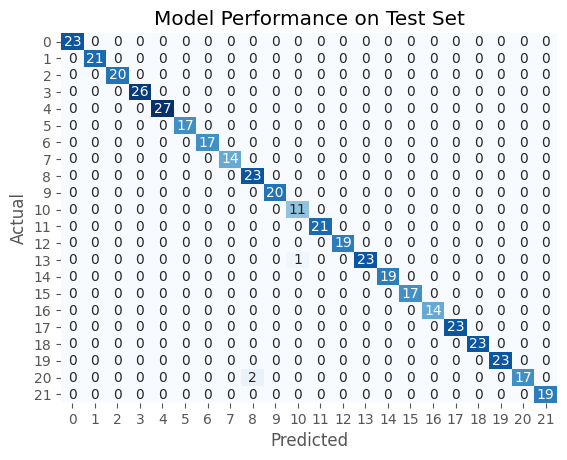

In [183]:
y_pred_dt = calibrated_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred_dt)
ax = plt.subplot()
sns.heatmap(cm, annot=True, fmt='g', ax=ax, cmap='Blues', cbar=False)
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
ax.set_title('Model Performance on Test Set')
plt.show()

**Note**
- While the model does not affect the model's classifying performance, the model shows an improvement in terms of accuracy. It is important to note that the model calibration focuses on probabilities by adjusting the prrobabilities to better reflect the true likelihood of an event. 
- As shown below, the Brier scores show a decrease from 0.0010 to 0.0005, naking the predictions closer to zero. This decrease indicates that the predicted probabilities of the Random Forest model are closer to the actual outcome. For the record, an ideal model has Brier score closer to 0.

In [184]:
# predict probabilities
y_prob = best_model.predict_proba(X_test)
y_encoded, y_classes = pd.factorize(y)

# Compute Brier score for each class and average
brier_scores = [brier_score_loss(y_test == i, y_prob[:, i]) for i in range(len(y_classes))]
average_brier_score = np.mean(brier_scores)

print(f'Average Brier score for pre-calibrated model: {average_brier_score:.4f}')

Average Brier score for pre-calibrated model: 0.0010


In [185]:
# predict probabilities
y_prob = calibrated_model.predict_proba(X_test)
y_encoded, y_classes = pd.factorize(y)

# Compute Brier score for each class and average
brier_scores = [brier_score_loss(y_test == i, y_prob[:, i]) for i in range(len(y_classes))]
average_brier_score = np.mean(brier_scores)

print(f'Average Brier score for post-calibrated model: {average_brier_score:.4f}')

Average Brier score for post-calibrated model: 0.0005


#### **4.5.6 Misclassification Analysis**

In [186]:
# Predict on test set & get predicted probabilities
y_pred = calibrated_model.predict(X_test)
y_prob = calibrated_model.predict_proba(X_test)

# Convert y_pred and y_test to series
y_pred_series = pd.Series(y_pred, index=X_test.index, name='Predicted')
y_test_series = pd.Series(y_test, index=X_test.index, name='Actual')

# Create DataFrame for predicted probabilities
prob_df = pd.DataFrame(y_prob, columns=[f'Prob_{label}' for label in range(y_prob.shape[1])], index=X_test.index)

# Combine predictions, actual values, and probabilities into a DataFrame
predictions_df = pd.DataFrame({
    'Actual': y_test_series,
    'Predicted': y_pred_series
})

# Concatenate features, predictions, and probabilities
predictions = pd.concat([X_test.reset_index(drop=True), 
                         predictions_df.reset_index(drop=True),
                         prob_df.reset_index(drop=True)], 
                        axis=1).round(3)

# Display the final DataFrame
display(predictions.head())

,N,P,K,temperature,humidity,ph,rainfall,Actual,Predicted,Prob_0,...,Prob_12,Prob_13,Prob_14,Prob_15,Prob_16,Prob_17,Prob_18,Prob_19,Prob_20,Prob_21
0,101,17,47,29.494,94.730,6.185,26.308,15,15,0.001,...,0.001,0.001,0.001,0.987,0.001,0.001,0.001,0.001,0.001,0.001
1,98,8,51,26.179,86.523,6.259,49.431,21,21,0.001,...,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.987
2,59,62,49,43.361,93.352,6.941,114.778,17,17,0.001,...,0.001,0.001,0.001,0.001,0.001,0.987,0.001,0.001,0.001,0.001
3,44,60,55,34.280,90.556,6.825,98.540,17,17,0.001,...,0.001,0.001,0.001,0.001,0.001,0.987,0.001,0.001,0.001,0.001
4,30,137,200,22.914,90.705,5.603,118.604,0,0,0.987,...,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001


In [187]:
# # predicts on test set & get pred proba
# y_pred = calibrated_model.predict(X_test)
# y_prob = calibrated_model.predict_proba(X_test)

# # convert y_pred and y_test to series
# y_pred_series = pd.Series(y_pred, index=X_test.index, name='Predicted')
# y_test_series = pd.Series(y_test, index=X_test.index, name='Actual')

# # convert series to df and concat with prob_df
# prob_df = pd.DataFrame(y_prob, columns=[f'Prob_{label}' for label in range(y_prob.shape[1])], index=X_test.index)
# predictions_df = pd.DataFrame({
#     'Index': X_test.index,  
#     'Actual': y_test_series,
#     'Predicted': y_pred_series
# })
# # display
# predictions = pd.concat([predictions_df, prob_df], axis=1).round(3)
# display(predictions.head())

In [188]:
# show mispredictions
misclassifications = predictions[predictions['Actual'] != predictions['Predicted']]
misclassifications.loc[:, ['Actual', 'Predicted', 'Prob_8', 'Prob_20']]

,Actual,Predicted,Prob_8,Prob_20
279,20,8,0.985,0.003
322,20,8,0.975,0.012
420,13,10,0.001,0.001


**Note**: The mispredictions here match the confusion matrix for the post-calibrated model in which there are three misclassifications: rice plants were incorrectly predicted as jute (2 times) and mothbeans plants were misclassified as lentil for once. The misclassifications were also reflected by the classification report in Section 4.5.1. But it remains uncovered by these misclassifications occurred.

In [189]:
# display labels for interpeting output
display(label_df)

,label,label_enc
1500,apple,0
1000,banana,1
700,blackgram,2
200,chickpea,3
1800,coconut,4
2100,coffee,5
1900,cotton,6
1200,grapes,7
2000,jute,8
300,kidneybeans,9


### **4.6 Best Model Explanation**

#### **4.6.1 Tree Plot**
Since random forest is basically a tree-based algorithm, below I display the tree to illustrate the decision process. However, there are several points to consider. (1) Randm forest comprises of many decision trees. Displaying the trees may not be informative enough to understand the overall model as what is displayed is only one among many trees in the model. As can be seen below, the tree is also lack of interpretability. The tree is a way too complex to interpret. 

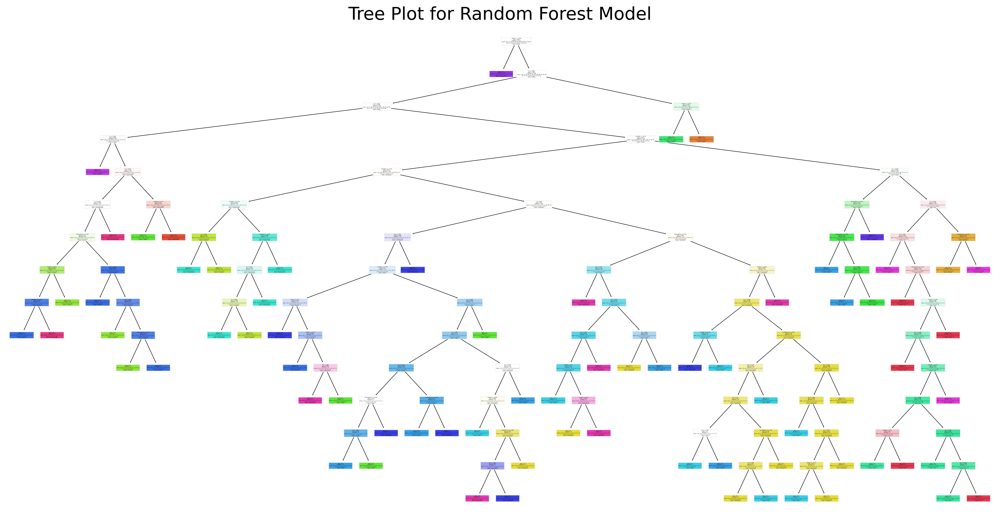

In [191]:
# visualize the first tree
plt.figure(figsize=(20,10), dpi=400)
plot_tree(best_model.named_steps['classifier'].estimators_[0], filled=True, 
          feature_names=X_train.columns, class_names=label_encoder.classes_)
plt.title('Tree Plot for Random Forest Model', size=20)
plt.show()

**Note**: Due to its compexity, I will rely on other explainable AI (XAI) methods to explain the model. The XAI methods, namely coefficient feature importance, Partial Dependence Plot (PDP) and Individual Conditional Expectation (ICE) plot, do not only summarize the general behavior of the model (global explanation), they can also explain the how the model makes a decision on the instance level (local explanation)

#### **4.6.2 Feature Importance**

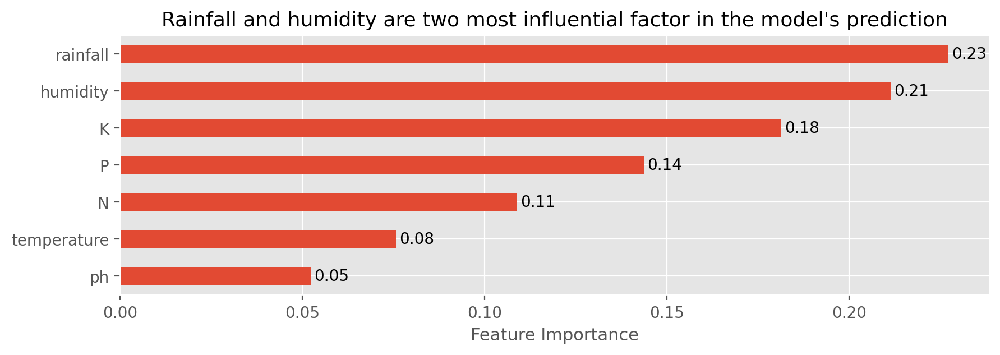

In [192]:
# prepare data
feature_names = X_train.columns
importances = pd.Series(best_model.named_steps['classifier'].feature_importances_, index=feature_names)
importances_sorted = importances.sort_values()

# plot coefficient
plt.figure(figsize=(10, 3), dpi=200)
ax = importances_sorted.plot(kind='barh')

# add labels to each bar
for i in ax.patches:
    ax.text(i.get_width() + 0.001, i.get_y() + i.get_height()/2, f'{i.get_width():.2f}', 
            va='center', ha='left')

plt.xlabel('Feature Importance', size=11)
plt.title('Rainfall and humidity are two most influential factor in the model\'s prediction', size=13)
plt.show()

**Note**
- Based on the feature importance, `rainfall` and `humidity` are top-two features showing the most significant impact to the model's predictions. As can be seen when the gini impurity of other features range between 0.05 and 0.21, these two environmental factors give substantial influence over the predictions.
- While this feature importance shows the greatest influence on the model's predictions, this only provides a half of the story. It only offer a global explanation on how the model makes a prediction. Alternatively saying, this feature importance informs general behavior of the model.
- To gain a deeper understanding of how the features affect the model's predictions, I will use Partial Dependence Plot (PDP) and Individual Conditional Expectation (ICE) Plot. 

#### **4.6.3 Partial Dependence and Individual Conditional Expectation Plot**
In order to understanding how the model behaves, especially using the most significant features on the predictions, namely rainfall and humidity, partial dependence plot (PDP) and individual conditional expectation (ICE) plot will be utilized. In general, PDP (<span style='color:orange'>orange dashed line</span>) represents the overall relationship between the two features and the predictions. The ICE plot, on the other hand, displays information about the variability of predictions for different instances (<span style='color:lightblue'>light blue lines</span>). These two lines can be visualized at once, providing a more complete picture about how two most significant features affect the model's predictions.

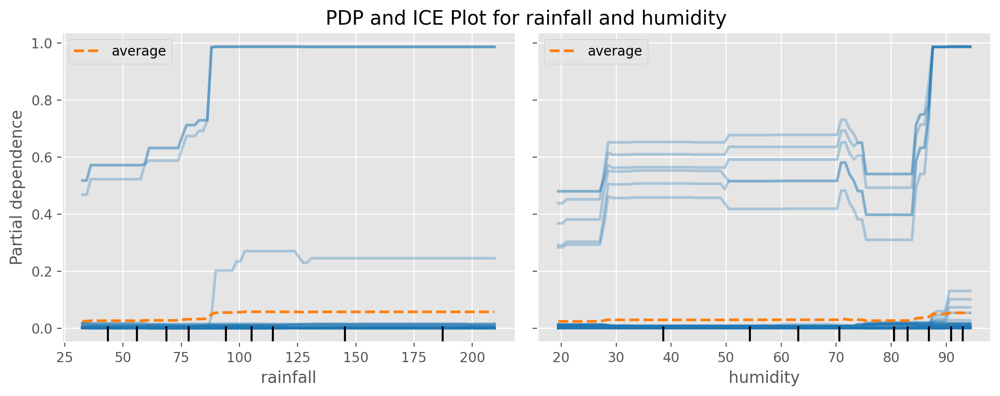

In [193]:
fig, ax = plt.subplots(figsize=(12, 4), dpi=200)

# create PDP and ICE plot with adjusted subsample
PartialDependenceDisplay.from_estimator(
    calibrated_model, X_train, ['rainfall', 'humidity'], 
    kind='both', 
    target=0, 
    subsample=50, 
    ax=ax, 
    line_kw={'linewidth': 2},        
    ice_lines_kw={'linewidth': 2})

# set the title
ax.set_title('PDP and ICE Plot for rainfall and humidity')
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.05, hspace=0.3)

plt.show()

**Note**:
- The plots indeed summarize how rainfall and humidity affect the model’s predictions. The <span style='color:orange'>orange dashed line</span> (PDP) shows the average effect of these features on the model’s predictions.
- Higher humidity or rainfall generally increases the partial dependence, meaning the model’s predictions are more favorable for certain crops as these values rise.
- The <span style='color:lightblue'>light blue lines</span> (ICE) show how individual predictions vary with changes in rainfall and humidity. Some crops are indeed more sensitive to these changes, indicating that not all crops respond the same way.
- While the ICE lines show some degree of variability, they generally follow the trend of the PDP, suggesting more stable predictions as rainfall and humidity increase.

#### **4.6.4 Counterfactual Explanation**
Here, my aim is to specify the most significant features, particularly for rainfall and humidity, contributing to the model's overall predictions. In brief, counterfactual explanation seeks to understand what will happen when the input is different. By changing the input leading to the class prediction change, it is possible to learn about how the model behaves in relation to the specific feature.

In [194]:
# prepare the data
df_train = X_train.copy()
df_train['label'] = y_train
cont_features = ['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall']

# define the data & model interface
data_interface = dice_ml.Data(dataframe=df_train, 
                              continuous_features=cont_features, 
                              outcome_name='label')
model_interface = dice_ml.Model(model=calibrated_model, 
                                backend='sklearn',
                                model_type='classifier')

# initialize Dice
dice = Dice(data_interface, model_interface, method='genetic')

##### **4.6.4.1 Changing `rainfall` values**

In [195]:
# compute desc statistics
data[data['label'] == 0].agg(func={'rainfall':'describe'}).transpose()

,count,mean,std,min,25%,50%,75%,max
rainfall,100.0,112.654779,7.102985,100.117344,106.070135,112.97923,118.449546,124.983162


**Note**: Since the aim here is to see how changing values in rainfall in apple crop can change the class predictions, it is essential to understand the range of values in apple's rainfall. These values serve as the basis of limiting the value range in rainfall. It can be seen that the range of rainfall needed to grow apple trees is between 100 and 124 mm/m-qubic. Below, I will check whether decreasing the rainfall intensity can change the class predictions.

In [196]:
# generate counterfactuals
np.random.seed(42)
random.seed(42)
crop = dice.generate_counterfactuals(X_test.iloc[[6], :], 
                                     total_CFs=5,
                                     desired_class=1,
                                     permitted_range={'rainfall': [0, 100]})  
crop.visualize_as_dataframe(show_only_changes=True)

100%|██████████| 1/1 [00:00<00:00,  6.17it/s]

Query instance (original outcome : 0)


,N,P,K,temperature,humidity,ph,rainfall,label
0,35,145,195,22.039116,94.580757,6.23195,110.9804,0



Diverse Counterfactual set (new outcome: 1)


,N,P,K,temperature,humidity,ph,rainfall,label
0,89.0,91.0,55.0,25.0834751,80.26173,6.2755723,94.329613,1.0
0,95.0,88.0,52.0,28.0031605,78.90086,-,94.681801,1.0
0,89.0,85.0,55.0,26.6719837,76.48542,6.2753844,91.733589,1.0
0,114.0,94.0,53.0,26.3354492,76.8532,6.1907573,36.636184,1.0
0,82.0,75.0,55.0,27.3458519,78.48738,6.2810693,92.155243,1.0


**Note**: At first, the rainfall is 110.98 mm/m-qubic. With counterfactual explanations, it can be seen that decreasing the rainfall intensity to below 100 mm/m-qubic, the predicted class changed from apple (class 0, see the output of `label_df` below) to banana (class 1) with high probability (> 80%). But it is important to note that the parameter `features_to_vary` for multilabel classification here cannot be set (resulting in an error) so while the range of values in `rainfall` can be set to a specific range of values, values in other variables also change despite not significant.

In [197]:
# extract counterfactual instances
counterfactual_instances = crop.cf_examples_list[0].final_cfs_df

# predict probabilities for the counterfactuals
cf_probs = calibrated_model.predict_proba(counterfactual_instances)

# add predicted probabilities 
counterfactual_instances['prob_apple'] = cf_probs[:, 0].round(2)
counterfactual_instances['prob_banana'] = cf_probs[:, 1].round(2)

# display output
counterfactual_instances

,N,P,K,temperature,humidity,ph,rainfall,label,prob_apple,prob_banana
0,89,91,55,25.083475,80.26173,6.275572,94.329613,1,0.0,0.99
0,95,88,52,28.003160,78.90086,6.235462,94.681801,1,0.0,0.99
0,89,85,55,26.671984,76.48542,6.275384,91.733589,1,0.0,0.99
0,114,94,53,26.335449,76.85320,6.190757,36.636184,1,0.0,0.81
0,82,75,55,27.345852,78.48738,6.281069,92.155243,1,0.0,0.99


##### **4.6.4.2 Changing `hummidity` values**

In [213]:
# compute desc statistics: apple
data[data['label'] == 0].agg(func={'humidity':'describe'}).transpose()

,count,mean,std,min,25%,50%,75%,max
humidity,100.0,92.333383,1.458551,90.025751,90.970127,92.416541,93.509252,94.920481


In [216]:
# compute desc statistics: banana
data[data['label'] == 1].agg(func={'humidity':'describe'}).transpose()

,count,mean,std,min,25%,50%,75%,max
humidity,100.0,80.358123,2.805481,75.031933,78.062229,80.223599,82.96024,84.978492


In [224]:
# generate counterfactuals
np.random.seed(42)
random.seed(42)
crop = dice.generate_counterfactuals(X_test.iloc[[6], :], 
                                     total_CFs=5,
                                     desired_class=1,
                                     permitted_range={'humidity': [0, 90]}
)  
crop.visualize_as_dataframe(show_only_changes=True)

100%|██████████| 1/1 [00:00<00:00,  6.29it/s]

Query instance (original outcome : 0)


,N,P,K,temperature,humidity,ph,rainfall,label
0,35,145,195,22.039116,94.580757,6.23195,110.9804,0



Diverse Counterfactual set (new outcome: 1)


,N,P,K,temperature,humidity,ph,rainfall,label
0,89.0,91.0,55.0,25.0834751,80.26173,6.2755723,94.329613,1.0
0,85.0,95.0,47.0,25.9401894,78.34221,6.211833,119.847969,1.0
0,101.0,75.0,50.0,26.5938644,81.4074,6.2425284,-,1.0
0,85.0,75.0,55.0,25.9401894,78.48738,6.2810693,119.847969,1.0
0,114.0,94.0,53.0,26.3354492,76.8532,6.1907573,118.685829,1.0


**Note**: Here, I attempt to generate counterfactual data to change the label 0 (apple) to 1 (banana) by limiting the value of humidity to below 90 (see descriptive statistics for banana). In general, when decreasing the relative humidity to below than 90, the moodel will change its predictions from apple to banana with high probability (> 95%) but here, of course, with also changes in other features as well. For example, the to decrease the relative humidity, the nitrogen and temperatures tend to increase whereas the phosphorous and potassium typically decrease.

In [225]:
# extract counterfactual instances
counterfactual_instances = crop.cf_examples_list[0].final_cfs_df

# predict probabilities for the counterfactuals
cf_probs = calibrated_model.predict_proba(counterfactual_instances)

# add predicted probabilities 
counterfactual_instances['prob_apple'] = cf_probs[:, 0].round(2)
counterfactual_instances['prob_banana'] = cf_probs[:, 1].round(2)

# display output
counterfactual_instances

,N,P,K,temperature,humidity,ph,rainfall,label,prob_apple,prob_banana
0,89,91,55,25.083475,80.26173,6.275572,94.329613,1,0.0,0.99
0,85,95,47,25.940189,78.34221,6.211833,119.847969,1,0.0,0.99
0,101,75,50,26.593864,81.40740,6.242528,109.982552,1,0.0,0.99
0,85,75,55,25.940189,78.48738,6.281069,119.847969,1,0.0,0.99
0,114,94,53,26.335449,76.85320,6.190757,118.685829,1,0.0,0.99


#### **4.6.4 Local Interpretable Model-Agnostic Explanation**

In [202]:
# prepare the LIME explainer
explainer = LimeTabularExplainer(
    X_train.values, 
    feature_names=X_train.columns,
    class_names=label_encoder.classes_, 
    mode='classification'
)

# convert the instance to a DataFrame with a single row
instance_df = pd.DataFrame(X_test, columns=X_test.columns)
instance_df.round(3).head(5)

,N,P,K,temperature,humidity,ph,rainfall
1451,101,17,47,29.494,94.730,6.185,26.308
1334,98,8,51,26.179,86.523,6.259,49.431
1761,59,62,49,43.361,93.352,6.941,114.778
1735,44,60,55,34.280,90.556,6.825,98.540
1576,30,137,200,22.914,90.705,5.603,118.604


In [203]:
# display predictions (for context)
display(predictions.loc[[6], ['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall', 'Actual', 'Predicted']])
display(label_df[label_df['label_enc'] == 0])

,N,P,K,temperature,humidity,ph,rainfall,Actual,Predicted
6,35,145,195,22.039,94.581,6.232,110.98,0,0


,label,label_enc
1500,apple,0


In [204]:
# explain instance
exp = explainer.explain_instance(
    instance_df.iloc[6].values, 
    best_model.named_steps['classifier'].predict_proba, 
    num_features=7,
    top_labels=1, 
)

# visualize the explanation
exp.show_in_notebook(show_table=True)

**Note**
- As informed on the dataframe above, the target variable index 6 is apple and the model correctly identified the class.
- Based on LIME explainer, it is shown that the prediction is apple (as expected) with probability of 0.52. The explainer displays how different features contribute to the predictions. For example, `P` (phosphorous), `temperature`, `humidity`, and `rainfall` contribute to the decision of apple.

### **4.7 Summary**
In Section 4, my objective is to build a multilable classification bases recommendation system for crop farming. In order to build the model, I compared different models and evaluated them using a number of classification evaluation metrics such as F1, precision, recall, accuracy, Hamming loss, and training time with more focus on F1 (micro-averaged). Based on the comparison and a series of evaluations, the best model was Random Forest with F1 score of 0.9949 (tuned). An evaluation on the feature importance indicated that rainfall and humidity is the most critical environmental factor in the recommendation system. For example, when limiting either rainfall or humidity to a specific range, the model changed its recommendation from apple to bananas with high confidence (probability) rate. A calibration was also done to the model to adjust its prediction probability to match the actual likelihood of the crop type.

In [228]:
# save model
joblib.dump(calibrated_model, '../model/clf_final.pkl')
print('Model saved successfully!')

Model saved successfully!


## **5 Conclusions**
The goal of this project is to build a recommendation system to recommend farmers what crop to plant according to several factors such as nutrients (nitrogen, potassium, phosphorous), acidity (pH), and environmental factors (rainfall, humidity, and temperature). To achieve this goal, I build a multilabel classifier model, involving 22 crop types. Based on the model comparison, Random Forest model was selected for a development and an evaluation. The Random Forest model achieved an excellent F1 score of 0.9949 and minor errors in its predictions, making the model a great option for the crop recommendation system. Based on a series of evaluations, it was found that environmental factors play the most significant roles in the model's prediction. While these environmental factors are hard to intervene, understanding the most critical feature in the model's decision can better guide the farmers to prepare the suitable crops for the environment. Furthermore, to more technical users, understanding the most important features can give them a better sense of how the model makes its decision when recommending a specific crop to the farmer.

In [231]:
import session_info
session_info.show()

<h1 style='color:orange; text-align:center; font-weight:bold'>---END---<h1>

___

#### **SHAP Force Plot: Local Explanation**

In [206]:
# locate first instance and label 15
display(X_test.iloc[[0], :])
display(label_df[label_df['label_enc'] == 15])

,N,P,K,temperature,humidity,ph,rainfall
1451,101,17,47,29.494014,94.729813,6.185053,26.308209


,label,label_enc
1400,muskmelon,15


**Note**: I will test the model using the first instance in the unseen data (`X_test`) in which the label is muskmelon (class 15).

In [207]:
import shap
shap.initjs()

# setup kernel explainer
explainer = shap.KernelExplainer(best_model.named_steps['classifier'].predict_proba, X_train)

# compute shap values
shap_values = explainer.shap_values(X_test.iloc[0, :])

# display force plot
shap.force_plot(explainer.expected_value[0], shap_values[:, 0], X_test.iloc[0, :])

Using 1760 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


**Note**: The force plot shows that while the base prediction is around 0.5218, the high nitrogen and moderate potassium level are slightly decreasing the model's confidence in the predicted class. The prediction of 0.52 is only marginally lower than the base value, indicating other features might have a balanced or minimal effect in this instance.

#### **K-Means Clustering**

In [252]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples
import numpy as np

In [251]:
# KMeans clustering
kmeans = KMeans(n_clusters=5, n_init='auto')  # Adjust n_clusters as needed
data['cluster'] = kmeans.fit_predict(X)  # X is your feature matrix
data.head()

,N,P,K,temperature,humidity,ph,rainfall,label,cluster
0,90,42,43,20.879744,82.002744,6.502985,202.935536,20,1
1,85,58,41,21.770462,80.319644,7.038096,226.655537,20,1
2,60,55,44,23.004459,82.320763,7.840207,263.964248,20,1
3,74,35,40,26.491096,80.158363,6.980401,242.864034,20,1
4,78,42,42,20.130175,81.604873,7.628473,262.717340,20,1


In [233]:
# prepare the data for PCA
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(data['label'])
X = data.select_dtypes(include='number')
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X)

# combine PCA result with labels
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])
pca_df['label'] = data['label'].values
pca_df.head()

,PC1,PC2,label
0,-60.012298,84.137339,20
1,-64.045235,107.875932,20
2,-75.004586,142.598295,20
3,-80.174280,117.493414,20
4,-84.935359,137.512216,20


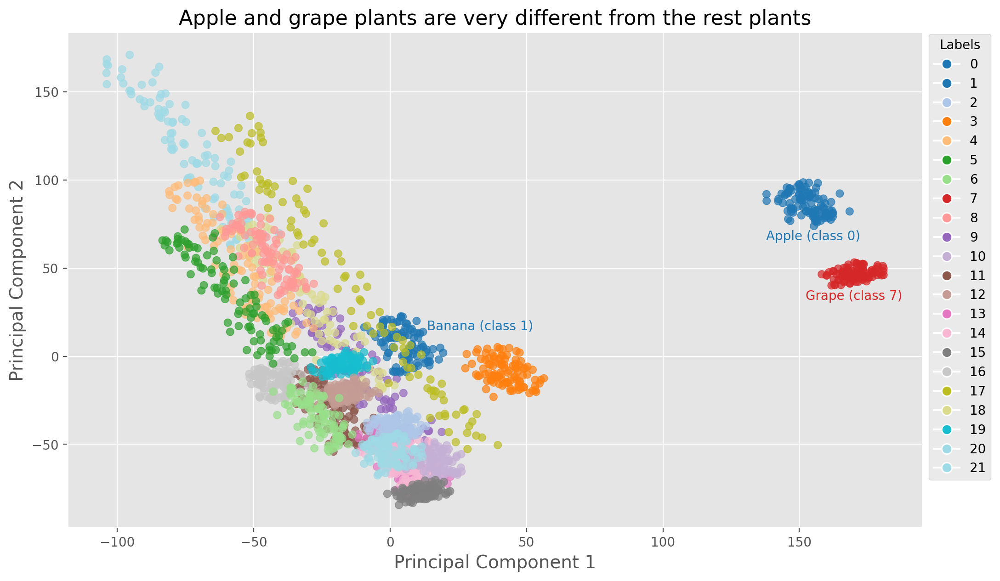

In [262]:
# plot using the encoded label
plt.figure(figsize=(12, 7), dpi=200)
scatter = plt.scatter(pca_result[:, 0], pca_result[:, 1], c=encoded_labels, cmap='tab20', alpha=0.7)
# plt.colorbar(scatter)  
plt.title('Apple and grape plants are very different from the rest plants', size=16)
plt.xlabel('Principal Component 1', size=14)
plt.ylabel('Principal Component 2', size=14)

# add a legend
unique_encoded_labels = np.unique(encoded_labels)
legend_labels = label_encoder.inverse_transform(unique_encoded_labels)
handles = [plt.Line2D([0], [0], marker='o', color='w', 
                      markerfacecolor=scatter.cmap(scatter.norm(i)), markersize=8) for i in unique_encoded_labels]
plt.text(x=155, y=68, s='Apple (class 0)', color='#1f77b4', fontsize=10, ha='center', va='center')
plt.text(x=33, y=17, s='Banana (class 1)', color='#1f77b4', fontsize=10, ha='center', va='center')
plt.text(x=170, y=34, s='Grape (class 7)', color='#d62728', fontsize=10, ha='center', va='center')
plt.legend(handles, legend_labels, title='Labels', bbox_to_anchor=(1, 1.01))
plt.show()

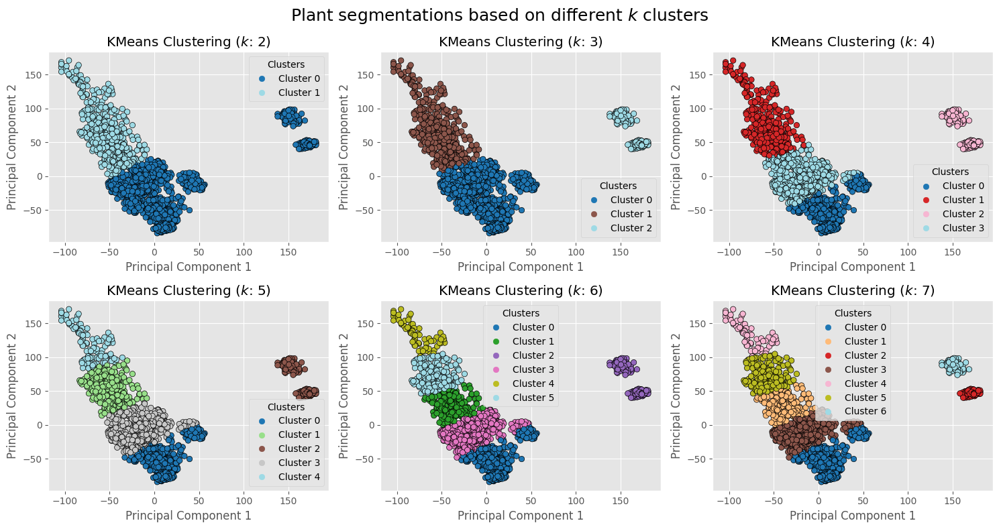

In [246]:
n_clusters_list = [2, 3, 4, 5, 6, 7]
plt.figure(figsize=(15, 8))

for n_clusters in n_clusters_list:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto')
    pca_df['kmeans_cluster'] = kmeans.fit_predict(pca_df[['PC1', 'PC2']])
    
    plt.subplot(2, 3, n_clusters - 1)
    
    # add scatter plot
    scatter = plt.scatter(pca_df['PC1'], pca_df['PC2'], 
                          c=pca_df['kmeans_cluster'], 
                          cmap=plt.get_cmap('tab20'), 
                          marker='o', edgecolor='k')
    
    # add legend
    handles, labels = scatter.legend_elements()
    plt.legend(handles, [f'Cluster {i}' for i in range(n_clusters)], title="Clusters")
    
    plt.title(f'KMeans Clustering ($k$: {n_clusters})')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')

plt.suptitle('Plant segmentations based on different $k$ clusters', size=18)
plt.tight_layout()
plt.show()

In [247]:
# compute inertia scores
inertia_scores = []
for k in range(2, 11):
    inertia = KMeans(n_clusters=k, random_state=42, n_init='auto').fit(data).inertia_
    inertia_scores.append(inertia)

inertia_scores

[14046776.815112429,
 7504977.875613125,
 5415912.478184032,
 4489379.2104323795,
 3802965.485747991,
 3453968.636490142,
 2978191.960745965,
 2735503.808389757,
 2175453.2184156757]

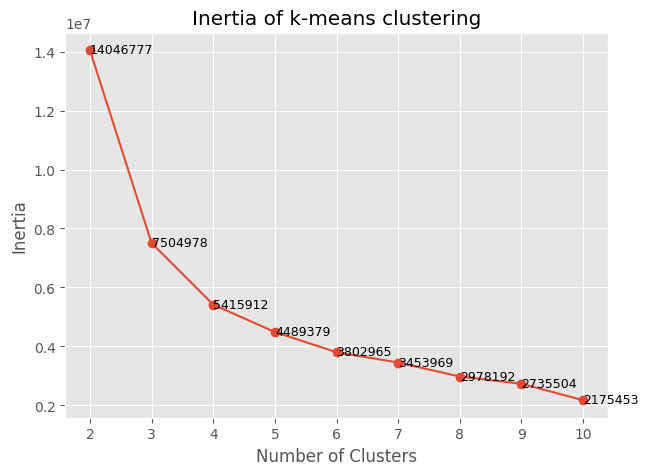

In [253]:
# visualize elbow curve
plt.figure(figsize=(7,5))
plt.scatter(range(2,11), inertia_scores)
plt.plot(range(2, 11), inertia_scores, marker='o')
for i, score in enumerate(inertia_scores, start=2):
    plt.text(i, score, f'{score:.0f}', fontsize=9, ha='left', va='center')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Inertia of k-means clustering')
plt.show()

In [255]:
# compute silhouette score
kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto').fit(data)
labels = kmeans.labels_
silhouette_avg = silhouette_score(data, labels)
print(f'Silhouette score: {silhouette_avg:.4f}')

Silhouette score: 0.4527


A silhouette score of 0.4527 suggests that the clusters are reasonably well-defined. This score indicates that, on average, the points are closer to their own cluster than to other clusters, but there is still some overlap or ambiguity.

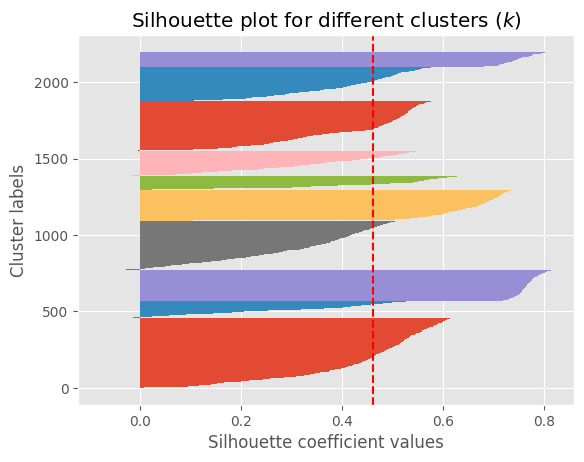

In [254]:
silhouette_vals = silhouette_samples(data, labels)
y_lower, y_upper = 0, 0
for i, cluster in enumerate(np.unique(labels)):
    cluster_silhouette_vals = silhouette_vals[labels == cluster]
    cluster_silhouette_vals.sort()
    y_upper += len(cluster_silhouette_vals)
    plt.barh(range(y_lower, y_upper), cluster_silhouette_vals, edgecolor='none', height=1)
    y_lower += len(cluster_silhouette_vals)

plt.axvline(x=silhouette_avg, color="red", linestyle="--")
plt.xlabel('Silhouette coefficient values')
plt.ylabel('Cluster labels')
plt.title('Silhouette plot for different clusters ($k$)')
plt.show()